In [1]:
import os
import yaml
from pathlib import Path
from tqdm import tqdm

import os
import yaml
from pathlib import Path
from tqdm import tqdm

def verify_and_create_yaml(dataset_path, dataset_name, output_dir):
    """
    Verifies dataset integrity and creates a .yaml file in the writable output directory.

    Args:
        dataset_path (Path): The read-only path to the dataset in /kaggle/input/.
        dataset_name (str): The short name for the dataset.
        output_dir (Path): The writable directory path in /kaggle/working/ for the output .yaml file.
    """
    print(f"--- Processing Dataset: {dataset_name} ---")
    
    if not dataset_path.exists():
        print(f"Directory not found: {dataset_path}. Skipping.\n")
        return

    # Standard subdirectories for YOLO datasets
    image_dir_name = 'images'
    label_dir_name = 'labels'
    
    # Initialize paths - these will be updated based on dataset structure
    train_images_path = dataset_path / 'train' / image_dir_name
    val_images_path = dataset_path / 'val' / image_dir_name
    all_label_paths = []
    class_indices = set()

    # --- Path Handling for Different Dataset Structures ---
    # This section adapts to the unique folder structure of each dataset
    structure_type = "standard"
    if "visdrone-dataset" in str(dataset_path):
        structure_type = "visdrone"
        train_images_path = dataset_path / 'VisDrone2019-DET-train' / image_dir_name
        val_images_path = dataset_path / 'VisDrone2019-DET-val' / image_dir_name
        # Add all relevant label directories for class scanning
        all_label_paths.append(dataset_path / 'VisDrone2019-DET-train' / label_dir_name)
        all_label_paths.append(dataset_path / 'VisDrone2019-DET-val' / label_dir_name)
        all_label_paths.append(dataset_path / 'VisDrone2019-DET-test-dev' / label_dir_name)

    elif "mvrsd-aerial" in str(dataset_path):
        structure_type = "mvrsd"
        print("Special case: 'mvrsd-aerial'. This dataset is not pre-split.")
        print("For robust training, you should manually split this into train/val sets.")
        # For this script, we'll point both train and val to the same data.
        # This is for demonstration; a real split is recommended.
        data_root = dataset_path / 'MVRSD_dataset' / 'data'
        train_images_path = data_root / image_dir_name
        val_images_path = data_root / image_dir_name # Using the same for now
        all_label_paths.append(data_root / label_dir_name)
        
    else: # For hit-uav, kiit-mita, and military-dataset assuming standard structure
        all_label_paths.append(dataset_path / 'train' / label_dir_name)
        all_label_paths.append(dataset_path / 'val' / label_dir_name)
        if (dataset_path / 'test' / label_dir_name).exists():
            all_label_paths.append(dataset_path / 'test' / label_dir_name)
            
    print("Verifying image and label correspondence...")
    # --- Verification Logic (reading from /kaggle/input) ---
    for split in ['train', 'val', 'test']:
        if structure_type == "visdrone":
            img_dir = dataset_path / f'VisDrone2019-DET-{split}' / image_dir_name
            lbl_dir = dataset_path / f'VisDrone2019-DET-{split}' / label_dir_name
        elif structure_type == "mvrsd":
             # Mvrsd isn't split, so we only check once
             if split != 'train': continue
             img_dir = train_images_path
             lbl_dir = train_images_path.parent / label_dir_name
        else: # Standard
            img_dir = dataset_path / split / image_dir_name
            lbl_dir = dataset_path / split / label_dir_name
        
        if not img_dir.exists() or not lbl_dir.exists():
            continue

        print(f"  Checking in split: '{split}'")
        image_files = {p.stem for p in img_dir.glob('*.*') if p.suffix.lower() in ['.jpg', '.jpeg', '.png']}
        label_files = {p.stem for p in lbl_dir.glob('*.txt')}

        if not image_files:
            print(f"  No images found in {img_dir}")
            continue
            
        missing_labels = image_files - label_files
        if missing_labels:
            print(f"  Warning: Found {len(missing_labels)} images in '{split}' with missing label files.")
    
    # --- Scan all available label files to determine number of classes ---
    print("\nScanning labels to determine class count...")
    for lbl_path in all_label_paths:
        if not lbl_path.exists(): continue
        
        for label_file in tqdm(list(lbl_path.glob('*.txt')), desc=f"  Scanning {lbl_path.parent.name}"):
            with open(label_file, 'r') as f:
                for line in f:
                    try:
                        class_id = int(line.split()[0])
                        class_indices.add(class_id)
                    except (ValueError, IndexError):
                        pass # Ignore malformed lines

    # --- YAML File Generation (writing to /kaggle/working) ---
    print("\nGenerating dataset.yaml file...")
    num_classes = max(class_indices) + 1 if class_indices else 0
    # IMPORTANT: You must verify these class names are correct for your dataset
    class_names = [f'class_{i}' for i in range(num_classes)]

    # The paths in the YAML MUST be the absolute paths to the INPUT directory
    yaml_content = {
        'path': str(dataset_path.resolve()),  # Root directory
        'train': str(train_images_path.resolve()), # Path to train images
        'val': str(val_images_path.resolve()),     # Path to val images
        'nc': num_classes,
        'names': class_names
    }

    output_yaml_path = output_dir / f"{dataset_name}.yaml"
    
    with open(output_yaml_path, 'w') as f:
        yaml.dump(yaml_content, f, sort_keys=False, default_flow_style=False)

    print(f"✅ Successfully created YAML file at: {output_yaml_path}")
    print("YAML Content:")
    print(yaml.dump(yaml_content, sort_keys=False))
    print(f"IMPORTANT: Please verify the 'names' list in the generated file is correct for the {dataset_name} dataset.")
    print("-" * 50 + "\n")


# --- Main Execution ---

# Define base paths for input (read-only) and output (writable)
kaggle_input_path = Path('/kaggle/input/')
kaggle_base_path = Path('/kaggle/input/')
kaggle_working_path = Path('/kaggle/working/')

# Create a dedicated folder in the working directory for our generated YAML files
generated_yamls_dir = kaggle_working_path / 'generated_dataset_yamls'
os.makedirs(generated_yamls_dir, exist_ok=True)
print(f"YAML files will be saved to: {generated_yamls_dir}\n")

# --- IMPORTANT: Verify these paths match your Kaggle dataset locations ---
datasets_to_process = {
    "hit-uav": kaggle_base_path / 'hituav-a-highaltitude-infrared-thermal-dataset/hit-uav',
    "mvrsd-aerial": kaggle_base_path / 'mvrsd-aerial/MVRSD_dataset/data',
    "visdrone-dataset": kaggle_base_path / 'visdrone-dataset/VisDrone_Dataset',
    "kiit-mita": kaggle_base_path / 'kiit-mita/KIIT-MiTA',
    "military-dataset": kaggle_base_path / 'military-assets-dataset-12-classes-yolo8-format/military_object_dataset'
}
# Process each dataset
for name, path in datasets_to_process.items():
    verify_and_create_yaml(
        dataset_path=path, 
        dataset_name=name, 
        output_dir=generated_yamls_dir
    )

print("✅ All datasets processed. Your YAML configuration files are ready for training.")



# for name, path in datasets_to_process.items():
#     verify_and_create_yaml(path, name)

print("All datasets processed.")


YAML files will be saved to: /kaggle/working/generated_dataset_yamls

--- Processing Dataset: hit-uav ---
Verifying image and label correspondence...

Scanning labels to determine class count...

Generating dataset.yaml file...
✅ Successfully created YAML file at: /kaggle/working/generated_dataset_yamls/hit-uav.yaml
YAML Content:
path: /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav
train: /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/train/images
val: /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/val/images
nc: 0
names: []

IMPORTANT: Please verify the 'names' list in the generated file is correct for the hit-uav dataset.
--------------------------------------------------

--- Processing Dataset: mvrsd-aerial ---
Special case: 'mvrsd-aerial'. This dataset is not pre-split.
For robust training, you should manually split this into train/val sets.
Verifying image and label correspondence...

Scanning labels to determine c

  Scanning VisDrone2019-DET-test-dev: 100%|██████████| 1610/1610 [00:05<00:00, 277.80it/s]



Generating dataset.yaml file...
✅ Successfully created YAML file at: /kaggle/working/generated_dataset_yamls/visdrone-dataset.yaml
YAML Content:
path: /kaggle/input/visdrone-dataset/VisDrone_Dataset
train: /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train/images
val: /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-val/images
nc: 10
names:
- class_0
- class_1
- class_2
- class_3
- class_4
- class_5
- class_6
- class_7
- class_8
- class_9

IMPORTANT: Please verify the 'names' list in the generated file is correct for the visdrone-dataset dataset.
--------------------------------------------------

--- Processing Dataset: kiit-mita ---
Verifying image and label correspondence...
  Checking in split: 'train'
  Checking in split: 'test'

Scanning labels to determine class count...


  Scanning test: 100%|██████████| 170/170 [00:00<00:00, 343.60it/s]



Generating dataset.yaml file...
✅ Successfully created YAML file at: /kaggle/working/generated_dataset_yamls/kiit-mita.yaml
YAML Content:
path: /kaggle/input/kiit-mita/KIIT-MiTA
train: /kaggle/input/kiit-mita/KIIT-MiTA/train/images
val: /kaggle/input/kiit-mita/KIIT-MiTA/val/images
nc: 7
names:
- class_0
- class_1
- class_2
- class_3
- class_4
- class_5
- class_6

IMPORTANT: Please verify the 'names' list in the generated file is correct for the kiit-mita dataset.
--------------------------------------------------

--- Processing Dataset: military-dataset ---
Verifying image and label correspondence...
  Checking in split: 'train'
  Checking in split: 'val'
  Checking in split: 'test'

Scanning labels to determine class count...


  Scanning test: 100%|██████████| 1396/1396 [00:04<00:00, 312.04it/s]


Generating dataset.yaml file...
✅ Successfully created YAML file at: /kaggle/working/generated_dataset_yamls/military-dataset.yaml
YAML Content:
path: /kaggle/input/military-assets-dataset-12-classes-yolo8-format/military_object_dataset
train: /kaggle/input/military-assets-dataset-12-classes-yolo8-format/military_object_dataset/train/images
val: /kaggle/input/military-assets-dataset-12-classes-yolo8-format/military_object_dataset/val/images
nc: 12
names:
- class_0
- class_1
- class_2
- class_3
- class_4
- class_5
- class_6
- class_7
- class_8
- class_9
- class_10
- class_11

IMPORTANT: Please verify the 'names' list in the generated file is correct for the military-dataset dataset.
--------------------------------------------------

✅ All datasets processed. Your YAML configuration files are ready for training.
All datasets processed.


In [2]:
import os
import yaml
import random
from pathlib import Path
from tqdm import tqdm

# --- Configuration ---
# Input and output directories
kaggle_input_path = Path('/kaggle/input/')
output_yamls_dir = Path('/kaggle/working/generated_dataset_yamls/')
print(f"Repairing YAML files in: {output_yamls_dir}\n")


def repair_mvrsd_aerial_dataset():
    """
    Handles the non-pre-split MVRSD dataset by creating a train/val split and a new YAML file.
    """
    print("-" * 50)
    print("Fixing: mvrsd-aerial dataset")
    dataset_name = "mvrsd_aerial"
    dataset_base_path = kaggle_input_path / 'mvrsd-aerial' / 'MVRSD_dataset'
    
    # Paths to the unsplit data and test folders
    data_images = dataset_base_path / 'data' / 'images'
    data_labels = dataset_base_path / 'data' / 'labels'
    test_images = dataset_base_path / 'test' / 'images'
    test_labels = dataset_base_path / 'test' / 'labels'
    
    all_image_paths = list(data_images.glob('*.jpg')) + list(test_images.glob('*.jpg'))
    
    if not all_image_paths:
        print("🚨 ERROR: No images found for MVRSD dataset. Cannot proceed.")
        return

    print(f"Found {len(all_image_paths)} total images. Splitting into train/val (80/20).")

    # --- Create Train/Val Split ---
    random.shuffle(all_image_paths)
    split_index = int(len(all_image_paths) * 0.8)
    train_image_paths = all_image_paths[:split_index]
    val_image_paths = all_image_paths[split_index:]
    
    # YOLOv8 can take .txt files listing image paths for train/val sets.
    # We will write these .txt files to the /kaggle/working/ directory.
    train_txt_path = output_yamls_dir / 'mvrsd_train.txt'
    val_txt_path = output_yamls_dir / 'mvrsd_val.txt'

    with open(train_txt_path, 'w') as f:
        for p in train_image_paths:
            f.write(str(p.resolve()) + '\n')
            
    with open(val_txt_path, 'w') as f:
        for p in val_image_paths:
            f.write(str(p.resolve()) + '\n')
    
    # --- Find Number of Classes by Scanning Labels ---
    class_indices = set()
    label_folders = [data_labels, test_labels]
    for folder in label_folders:
        for label_file in tqdm(list(folder.glob('*.txt')), desc=f"  Scanning labels in {folder.parent.name}"):
            with open(label_file, 'r') as f:
                for line in f:
                    try: class_indices.add(int(line.split()[0]))
                    except: pass
                        
    num_classes = max(class_indices) + 1 if class_indices else 0
    if num_classes == 0:
        print("🚨 WARNING: Could not find any classes in MVRSD label files.")
        return

    # --- Create and Write New YAML File ---
    yaml_content = {
        'path': str(dataset_base_path.resolve()),
        'train': str(train_txt_path.resolve()), # Points to the text file with image paths
        'val': str(val_txt_path.resolve()),     # Points to the text file with image paths
        'nc': num_classes,
        'names': [f'class_{i}' for i in range(num_classes)]
    }
    
    output_yaml_path = output_yamls_dir / 'mvrsd-aerial.yaml'
    with open(output_yaml_path, 'w') as f:
        yaml.dump(yaml_content, f, sort_keys=False, default_flow_style=False)
        
    print(f"✅ Successfully REPAIRED and REPLACED YAML at: {output_yaml_path}")
    print("New YAML Content:")
    print(yaml.dump(yaml_content, sort_keys=False))
    print("-" * 50 + "\n")


def repair_kiit_mita_dataset():
    """
    Handles the KIIT-MiTA dataset by correctly identifying the 'valid' directory.
    """
    print("-" * 50)
    print("Fixing: kiit-mita dataset")
    dataset_name = "kiit_mita"
    dataset_base_path = kaggle_input_path / 'kiit-mita' / 'KIIT-MiTA'

    train_path = dataset_base_path / 'train'
    # Check for 'valid' folder specifically
    val_path = dataset_base_path / 'valid' 
    
    if not val_path.exists():
        print(f"🚨 ERROR: Directory not found: {val_path}. Cannot proceed.")
        return

    # --- Find Number of Classes by Scanning Labels ---
    class_indices = set()
    for folder in [train_path, val_path]:
        label_dir = folder / 'labels'
        if not label_dir.exists(): continue
        for label_file in tqdm(list(label_dir.glob('*.txt')), desc=f"  Scanning labels in {folder.name}"):
            with open(label_file, 'r') as f:
                for line in f:
                    try: class_indices.add(int(line.split()[0]))
                    except: pass
    
    num_classes = max(class_indices) + 1 if class_indices else 0
    if num_classes == 0:
        print("🚨 WARNING: Could not find any classes in KIIT-MiTA label files.")
        return
        
    # --- Create and Write New YAML File ---
    yaml_content = {
        'path': str(dataset_base_path.resolve()),
        'train': str((train_path / 'images').resolve()),
        'val': str((val_path / 'images').resolve()),
        'nc': num_classes,
        'names': [f'class_{i}' for i in range(num_classes)]
    }

    output_yaml_path = output_yamls_dir / 'kiit-mita.yaml'
    with open(output_yaml_path, 'w') as f:
        yaml.dump(yaml_content, f, sort_keys=False, default_flow_style=False)
        
    print(f"✅ Successfully REPAIRED and REPLACED YAML at: {output_yaml_path}")
    print("New YAML Content:")
    print(yaml.dump(yaml_content, sort_keys=False))
    print("-" * 50 + "\n")


# --- Execute the Repair Functions ---
# repair_mvrsd_aerial_dataset()
repair_kiit_mita_dataset()

print("✅ Repair process complete. You can now re-run the training cell.")

Repairing YAML files in: /kaggle/working/generated_dataset_yamls

--------------------------------------------------
Fixing: kiit-mita dataset


  Scanning labels in valid: 100%|██████████| 170/170 [00:00<00:00, 274.41it/s]

✅ Successfully REPAIRED and REPLACED YAML at: /kaggle/working/generated_dataset_yamls/kiit-mita.yaml
New YAML Content:
path: /kaggle/input/kiit-mita/KIIT-MiTA
train: /kaggle/input/kiit-mita/KIIT-MiTA/train/images
val: /kaggle/input/kiit-mita/KIIT-MiTA/valid/images
nc: 7
names:
- class_0
- class_1
- class_2
- class_3
- class_4
- class_5
- class_6

--------------------------------------------------

✅ Repair process complete. You can now re-run the training cell.


In [3]:
import os
import yaml
from pathlib import Path
from tqdm import tqdm

# --- Configuration ---
kaggle_input_path = Path('/kaggle/input/')
output_yamls_dir = Path('/kaggle/working/generated_dataset_yamls/')
print(f"Starting final repair for hituav and mvrsd-aerial YAML files in: {output_yamls_dir}\n")


def final_correct_hituav_function():
    """
    Generates the hit-uav.yaml based on the correct, parallel structure:
    - /images/train, /images/val
    - /labels/train, /labels/val
    """
    print("-" * 50)
    print("Fixing: hit-uav dataset (Using Correct Parallel Structure)")
    
    try:
        dataset_base_path = kaggle_input_path / 'hituav-a-highaltitude-infrared-thermal-dataset' / 'hit-uav'
        
        # --- Define paths based on the CORRECT parallel structure ---
        train_img_path = dataset_base_path / 'images' / 'train'
        val_img_path = dataset_base_path / 'images' / 'val'
        
        train_lbl_path = dataset_base_path / 'labels' / 'train'
        val_lbl_path = dataset_base_path / 'labels' / 'val'
        test_lbl_path = dataset_base_path / 'labels' / 'test' # For complete class scanning

        # --- Verify all necessary directories exist ---
        required_paths = [train_img_path, val_img_path, train_lbl_path, val_lbl_path]
        if not all(p.exists() for p in required_paths):
            print("🚨 ERROR: One or more required subdirectories (images/train, labels/train, etc.) were not found.")
            return

        # --- Scan all label splits (train, val, test) to find the number of classes ---
        class_indices = set()
        label_dirs_to_scan = [train_lbl_path, val_lbl_path, test_lbl_path]

        for label_dir in label_dirs_to_scan:
            if not label_dir.exists(): continue
            
            for label_file in tqdm(list(label_dir.glob('*.txt')), desc=f"  Scanning labels in {label_dir.name}"):
                with open(label_file, 'r') as f:
                    for line in f:
                        try:
                            class_id = int(line.split()[0])
                            class_indices.add(class_id)
                        except (ValueError, IndexError):
                            pass
        
        num_classes = max(class_indices) + 1 if class_indices else 0
        if num_classes == 0:
            print("🚨 WARNING: No valid classes were found in any of the hit-uav label folders.")
            return

        # --- Create and Write the Correct YAML File ---
        yaml_content = {
            'path': str(dataset_base_path.resolve()),
            'train': str(train_img_path.resolve()), # Path to train images
            'val': str(val_img_path.resolve()),     # Path to validation images
            'nc': num_classes,
            'names': [f'class_{i}' for i in range(num_classes)]
        }

        output_yaml_path = output_yamls_dir / 'hit-uav.yaml'
        with open(output_yaml_path, 'w') as f:
            yaml.dump(yaml_content, f, sort_keys=False, default_flow_style=False)
            
        print(f"\n✅ Successfully REPAIRED and REPLACED YAML at: {output_yaml_path}")
        print("New YAML Content:")
        print(yaml.dump(yaml_content, sort_keys=False))

    except Exception as e:
        print(f"An unexpected error occurred while fixing hit-uav: {e}")
    finally:
        print("-" * 50)


def final_fix_mvrsd_aerial():
    """
    Correctly generates the mvrsd-aerial.yaml based on its actual split structure
    and uses the provided classes.txt file for class names.
    """
    print("-" * 50)
    print("Fixing: mvrsd-aerial dataset (Final Version)")

    try:
        dataset_base_path = kaggle_input_path / 'mvrsd-aerial' / 'MVRSD_dataset'
        
        # Define paths based on the correct structure
        train_img_path = dataset_base_path / 'data' / 'images' / 'train'
        val_img_path = dataset_base_path / 'data' / 'images' / 'val'
        classes_txt_path = dataset_base_path / 'data' / 'labels' / 'classes.txt'

        if not all([train_img_path.exists(), val_img_path.exists(), classes_txt_path.exists()]):
            print(f"🚨 ERROR: A required file/directory was not found for mvrsd-aerial. Please check paths.")
            print(f"  - Train images exist: {train_img_path.exists()}")
            print(f"  - Val images exist: {val_img_path.exists()}")
            print(f"  - classes.txt exists: {classes_txt_path.exists()}")
            return
            
        # --- Read the classes.txt file to get nc and names ---
        with open(classes_txt_path, 'r') as f:
            class_names = [line.strip() for line in f if line.strip()]
        
        num_classes = len(class_names)
        if num_classes == 0:
            print("🚨 WARNING: classes.txt file is empty for mvrsd-aerial.")
            return

        # --- Create and Write New YAML File ---
        yaml_content = {
            'path': str(dataset_base_path.resolve()),
            'train': str(train_img_path.resolve()),
            'val': str(val_img_path.resolve()),
            'nc': num_classes,
            'names': class_names # Use the actual names from classes.txt
        }

        output_yaml_path = output_yamls_dir / 'mvrsd-aerial.yaml'
        with open(output_yaml_path, 'w') as f:
            yaml.dump(yaml_content, f, sort_keys=False, default_flow_style=False)
            
        print(f"✅ Successfully REPAIRED and REPLACED YAML at: {output_yaml_path}")
        print("New YAML Content:")
        print(yaml.dump(yaml_content, sort_keys=False))

    except Exception as e:
        print(f"An unexpected error occurred while fixing mvrsd-aerial: {e}")
    finally:
        print("-" * 50 + "\n")


# --- Execute Both Repair Functions ---
final_correct_hituav_function()
final_fix_mvrsd_aerial()

print("✅ All repairs complete. You can now un-comment and run the full training sequence.")

Starting final repair for hituav and mvrsd-aerial YAML files in: /kaggle/working/generated_dataset_yamls

--------------------------------------------------
Fixing: hit-uav dataset (Using Correct Parallel Structure)


  Scanning labels in test: 100%|██████████| 571/571 [00:02<00:00, 281.30it/s]


✅ Successfully REPAIRED and REPLACED YAML at: /kaggle/working/generated_dataset_yamls/hit-uav.yaml
New YAML Content:
path: /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav
train: /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/train
val: /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/val
nc: 5
names:
- class_0
- class_1
- class_2
- class_3
- class_4

--------------------------------------------------
--------------------------------------------------
Fixing: mvrsd-aerial dataset (Final Version)
✅ Successfully REPAIRED and REPLACED YAML at: /kaggle/working/generated_dataset_yamls/mvrsd-aerial.yaml
New YAML Content:
path: /kaggle/input/mvrsd-aerial/MVRSD_dataset
train: /kaggle/input/mvrsd-aerial/MVRSD_dataset/data/images/train
val: /kaggle/input/mvrsd-aerial/MVRSD_dataset/data/images/val
nc: 5
names:
- SMV
- LMV
- AFV
- CV
- MCV

--------------------------------------------------

✅ All repairs complete. You ca

In [4]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 18.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 78.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 58.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 7.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 63.5 MB/s eta 0:00:00:00:0100:01
  Attempting unins

In [5]:
# import os
# import torch
# from pathlib import Path
# from ultralytics import YOLO

# # --- 1. Setup Paths and Training Configuration ---

# # Path to the directory where your YAML files were generated
# generated_yamls_dir = Path('/kaggle/working/generated_dataset_yamls/')

# # Path to a new directory where all training runs will be saved
# training_output_dir = Path('/kaggle/working/yolo_training_runs/')
# os.makedirs(training_output_dir, exist_ok=True)

# # Training parameters
# EPOCHS = 75
# IMG_SIZE = 640
# INITIAL_MODEL = 'yolov8n.pt' 

# print(f"Starting sequential training...")
# print(f"Initial model: {INITIAL_MODEL}")
# print(f"Epochs per dataset: {EPOCHS}")
# print(f"Image size: {IMG_SIZE}")
# print(f"All outputs will be saved in: {training_output_dir}\n")

# # --- 2. Define the Sequential Training Order ---
# # CORRECTED: The '.yaml' filenames now exactly match the files shown in your screenshot.
# training_sequence = [
#     {'name': 'visdrone', 'yaml': generated_yamls_dir / 'visdrone-dataset.yaml'},
#     {'name': 'mvrsd_aerial', 'yaml': generated_yamls_dir / 'mvrsd-aerial.yaml'},
#     {'name': 'kiit_mita', 'yaml': generated_yamls_dir / 'kiit-mita.yaml'},
#     {'name': 'military_assets', 'yaml': generated_yamls_dir / 'military-dataset.yaml'},
#     {'name': 'hituav_thermal', 'yaml': generated_yamls_dir / 'hit-uav.yaml'},
# ]

# # Variable to hold the path to the weights for the next training run
# current_model_weights = INITIAL_MODEL

# # --- 3. Execute the Training Loop ---

# for i, dataset in enumerate(training_sequence):
#     dataset_name = dataset['name']
#     yaml_path = dataset['yaml']
    
#     print("-" * 60)
#     print(f"STEP {i+1}/{len(training_sequence)}: TRAINING ON '{dataset_name.upper()}' DATASET")
#     print("-" * 60)
#     print(f"Using model weights from: {current_model_weights}")
#     print(f"Using dataset config: {yaml_path}\n")

#     if not yaml_path.exists():
#         print(f"🚨 ERROR: YAML file not found at {yaml_path}. Please double-check the filename. Skipping this step.")
#         continue

#     # Initialize the YOLO model
#     model = YOLO(current_model_weights)

#     # Define a unique name for this specific training run
#     run_name = f"{i+1}_{dataset_name}_train"

#     # Train the model
#     results = model.train(
#         data=str(yaml_path),
#         epochs=EPOCHS,
#         imgsz=IMG_SIZE,
#         project=str(training_output_dir),
#         name=run_name,
#         exist_ok=True,
#     )
    
#     # Update the path of `current_model_weights` to the 'best.pt' from this run
#     new_weights_path = training_output_dir / run_name / 'weights' / 'best.pt'
    
#     if new_weights_path.exists():
#         current_model_weights = str(new_weights_path)
#         print(f"\n✅ Training on '{dataset_name}' complete.")
#         print(f"New model weights saved to: {current_model_weights}\n")
#     else:
#         print(f"🚨 ERROR: Could not find 'best.pt' for the '{dataset_name}' run. Halting sequence.")
#         break
        
#     # Clear memory
#     del model
#     if torch.cuda.is_available():
#         torch.cuda.empty_cache()

# # --- 4. Final Summary ---
# print("=" * 60)
# print("SEQUENTIAL TRAINING COMPLETE")
# print("=" * 60)
# print(f"The final, fully trained model is located at:")
# print(current_model_weights)

In [6]:
import os
import torch
from pathlib import Path
from ultralytics import YOLO

# --- 1. Setup Paths and Training Configuration ---
generated_yamls_dir = Path('/kaggle/working/generated_dataset_yamls/')
# Create a new, specific output directory for this complex run
training_output_dir = Path('/kaggle/working/yolo_custom_plan_run/')
os.makedirs(training_output_dir, exist_ok=True)

IMG_SIZE = 640
# Using yolov8s.pt as requested, a good choice for a more powerful base
INITIAL_MODEL = 'yolov8s.pt' 

print("--- Starting Custom Multi-Phase Sequential Training ---")
print(f"Initial model: {INITIAL_MODEL}")
print(f"All outputs will be saved in: {training_output_dir}\n")


# --- 2. Define the Custom Multi-Phase Training Plan ---
# This list of dictionaries defines each specific step of your plan.
training_plan = [
    # --- Phase 1: General Foundation Training (100 Epochs each) ---
    {'phase': '1 - Foundation', 'name': 'visdrone',        'yaml': generated_yamls_dir / 'visdrone-dataset.yaml', 'epochs': 100},
    {'phase': '1 - Foundation', 'name': 'kiit_mita',       'yaml': generated_yamls_dir / 'kiit-mita.yaml',        'epochs': 100},
    {'phase': '1 - Foundation', 'name': 'mvrsd_aerial',    'yaml': generated_yamls_dir / 'mvrsd-aerial.yaml',     'epochs': 100},
    {'phase': '1 - Foundation', 'name': 'hituav_thermal',  'yaml': generated_yamls_dir / 'hit-uav.yaml',          'epochs': 100},

    # --- Phase 2: Specialization on Primary Target (25 Epochs) ---
    {'phase': '2 - Specialization', 'name': 'military_assets', 'yaml': generated_yamls_dir / 'military-dataset.yaml', 'epochs': 25},
    
    # --- Phase 3: Refinement to Prevent Forgetting (5 Epochs each) ---
    {'phase': '3 - Refinement', 'name': 'visdrone_refine',       'yaml': generated_yamls_dir / 'visdrone-dataset.yaml', 'epochs': 5},
    {'phase': '3 - Refinement', 'name': 'kiit_mita_refine',      'yaml': generated_yamls_dir / 'kiit-mita.yaml',        'epochs': 5},
    {'phase': '3 - Refinement', 'name': 'mvrsd_aerial_refine',   'yaml': generated_yamls_dir / 'mvrsd-aerial.yaml',     'epochs': 5},
    {'phase': '3 - Refinement', 'name': 'hituav_thermal_refine', 'yaml': generated_yamls_dir / 'hit-uav.yaml',          'epochs': 5}
]

# Variable to hold the path to the weights for the next training run
current_model_weights = INITIAL_MODEL

# --- 3. Execute the Custom Training Loop ---
total_steps = len(training_plan)
for i, step_info in enumerate(training_plan):
    phase = step_info['phase']
    dataset_name = step_info['name']
    yaml_path = step_info['yaml']
    epochs_for_this_step = step_info['epochs']
    
    print("=" * 70)
    print(f"Executing Step {i+1}/{total_steps} | Phase: '{phase}'")
    print(f"TRAINING ON: '{dataset_name.upper()}' for {epochs_for_this_step} EPOCHS")
    print("-" * 70)
    print(f"Using model weights from: {current_model_weights}")
    print(f"Using dataset config: {yaml_path}\n")

    if not yaml_path.exists():
        print(f"🚨 ERROR: YAML file not found at {yaml_path}. Halting sequence.")
        break

    # Initialize the YOLO model
    model = YOLO(current_model_weights)

    # Define a unique name for this specific training run
    run_name = f"{i+1}_{dataset_name}"

    # Train the model with the specified number of epochs for this step
    results = model.train(
        data=str(yaml_path),
        epochs=epochs_for_this_step,
        imgsz=IMG_SIZE,
        project=str(training_output_dir),
        name=run_name,
        exist_ok=True,
    )
    
    # Update the path of `current_model_weights` to the 'best.pt' from this run
    new_weights_path = training_output_dir / run_name / 'weights' / 'best.pt'
    
    if new_weights_path.exists():
        current_model_weights = str(new_weights_path)
        print(f"\n✅ Step {i+1} complete. New model weights for next step are at:")
        print(f"   {current_model_weights}\n")
    else:
        print(f"🚨 FATAL ERROR: Could not find 'best.pt' for the '{dataset_name}' run. Halting sequence.")
        break
        
    # Clear memory for the next run
    del model
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

# --- 4. Final Summary ---
print("=" * 70)
print("✅ CUSTOM SEQUENTIAL TRAINING PLAN COMPLETE")
print("=" * 70)
print(f"The final, master model is located at:")
print(current_model_weights)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
--- Starting Custom Multi-Phase Sequential Training ---
Initial model: yolov8s.pt
All outputs will be saved in: /kaggle/working/yolo_custom_plan_run

Executing Step 1/9 | Phase: '1 - Foundation'
TRAINING ON: 'VISDRONE' for 100 EPOCHS
----------------------------------------------------------------------
Using model weights from: yolov8s.pt
Using dataset config: /kaggle/working/generated_dataset_yamls/visdrone-dataset.yaml



Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/generated_dataset_yamls/visdrone-dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=1_visdrone, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=

Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytic

AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.4±0.1 ms, read: 34.9±16.0 MB/s, size: 261.9 KB)


train: Scanning /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train/labels... 6471 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6471/6471 [00:21<00:00, 303.21it/s]

train: /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train/images/0000137_02220_d_0000163.jpg: 1 duplicate labels removed
train: /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train/images/0000140_00118_d_0000002.jpg: 1 duplicate labels removed
train: /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train/images/9999945_00000_d_0000114.jpg: 1 duplicate labels removed
train: /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train/images/9999987_00000_d_0000049.jpg: 1 duplicate labels removed


WARNING ⚠️ train: Cache directory /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 20.5±3.3 MB/s, size: 131.6 KB)


val: Scanning /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:01<00:00, 303.79it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-val is not writeable, cache not saved.


Plotting labels to /kaggle/working/yolo_custom_plan_run/1_visdrone/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/yolo_custom_plan_run/1_visdrone
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      9.54G      1.599      1.824      1.022        628        640: 100%|██████████| 405/405 [02:11<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.61it/s]


                   all        548      38759      0.304      0.256       0.22      0.123

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      7.87G      1.516      1.248     0.9645        478        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  3.00it/s]


                   all        548      38759      0.355      0.268      0.248       0.14

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.44G      1.562      1.247      0.966        642        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.98it/s]


                   all        548      38759      0.343       0.27      0.248       0.14

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      7.76G      1.549      1.216     0.9646        657        640: 100%|██████████| 405/405 [02:15<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.96it/s]

                   all        548      38759      0.347      0.288      0.265      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.58G       1.51      1.165      0.956        835        640: 100%|██████████| 405/405 [02:14<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.09it/s]

                   all        548      38759      0.379      0.305      0.281      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      8.59G      1.492      1.141      0.949        315        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.14it/s]

                   all        548      38759      0.396      0.302      0.287      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      9.13G      1.457      1.109     0.9432        581        640: 100%|██████████| 405/405 [02:15<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.10it/s]

                   all        548      38759      0.402      0.309      0.299      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      10.5G      1.446      1.086     0.9369        487        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.18it/s]


                   all        548      38759       0.41      0.329      0.317      0.183

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      7.96G      1.422      1.061     0.9343        643        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.01it/s]


                   all        548      38759      0.412      0.312      0.309      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      8.13G      1.425       1.06     0.9328        644        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.08it/s]

                   all        548      38759      0.413      0.327      0.317      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      9.15G      1.405       1.04     0.9284        634        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.08it/s]


                   all        548      38759      0.431      0.319      0.318      0.183

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      9.19G      1.401      1.028      0.925        847        640: 100%|██████████| 405/405 [02:16<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.15it/s]

                   all        548      38759       0.43      0.343      0.333      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      9.66G      1.389      1.022     0.9246        273        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.15it/s]

                   all        548      38759      0.443      0.333      0.332      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      9.01G      1.371      1.005     0.9214        611        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.99it/s]


                   all        548      38759      0.439      0.341      0.336      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.09G       1.37     0.9914     0.9178        527        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.13it/s]


                   all        548      38759      0.454      0.337       0.34      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      8.87G      1.361     0.9848     0.9168        880        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.21it/s]

                   all        548      38759      0.455      0.335      0.341      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      8.81G       1.36     0.9819     0.9157        554        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.17it/s]


                   all        548      38759      0.448      0.342      0.339      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       8.6G      1.357     0.9781     0.9167        398        640: 100%|██████████| 405/405 [02:16<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.15it/s]

                   all        548      38759       0.46       0.35      0.352      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       7.7G      1.343     0.9653     0.9124        309        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.06it/s]

                   all        548      38759      0.467      0.353      0.357      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       8.4G      1.339      0.954     0.9127        829        640: 100%|██████████| 405/405 [02:16<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.16it/s]

                   all        548      38759      0.459      0.354      0.353      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      7.62G      1.338     0.9509     0.9126        490        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.14it/s]


                   all        548      38759      0.477      0.354      0.361      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100       9.3G      1.338     0.9485     0.9109        710        640: 100%|██████████| 405/405 [02:16<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.12it/s]

                   all        548      38759      0.473      0.356      0.358      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      9.03G      1.318     0.9386     0.9075        452        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.16it/s]

                   all        548      38759      0.466      0.355      0.362      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.31G      1.315     0.9302     0.9077        651        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.19it/s]


                   all        548      38759      0.481      0.347      0.362      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      9.85G      1.309     0.9247     0.9062        360        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.17it/s]


                   all        548      38759      0.485      0.351      0.365      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.97G      1.313     0.9214      0.905        526        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.12it/s]


                   all        548      38759      0.489      0.357      0.369      0.217

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.81G      1.303     0.9138     0.9046        646        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.20it/s]

                   all        548      38759      0.482      0.363       0.37      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      7.98G      1.307     0.9109      0.902        707        640: 100%|██████████| 405/405 [02:16<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.15it/s]


                   all        548      38759      0.488       0.36       0.37      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      9.22G      1.296     0.9075     0.9005        418        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.22it/s]


                   all        548      38759      0.486      0.363      0.375      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.88G      1.289     0.9001     0.9011        614        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.20it/s]


                   all        548      38759      0.485      0.365      0.374      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.35G      1.296     0.8997     0.9003        654        640: 100%|██████████| 405/405 [02:16<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.11it/s]


                   all        548      38759      0.476      0.366      0.376      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      7.21G      1.291     0.8938     0.8989        399        640: 100%|██████████| 405/405 [02:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.17it/s]

                   all        548      38759      0.495       0.37       0.38      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      10.6G      1.287     0.8898     0.8989        697        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.24it/s]

                   all        548      38759      0.492      0.371      0.378      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      7.33G      1.276     0.8804     0.8996        893        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.16it/s]

                   all        548      38759      0.481      0.372      0.378      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      9.99G      1.274     0.8746     0.8968        439        640: 100%|██████████| 405/405 [02:14<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.33it/s]

                   all        548      38759      0.486      0.374       0.38      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      8.18G      1.274      0.875      0.896        755        640: 100%|██████████| 405/405 [02:15<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.26it/s]

                   all        548      38759      0.483      0.372      0.378      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      9.14G      1.269     0.8723     0.8969        503        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.36it/s]

                   all        548      38759      0.492      0.369      0.381      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.87G      1.267     0.8681     0.8948        842        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.30it/s]

                   all        548      38759      0.499      0.373      0.381      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.37G      1.263     0.8638     0.8931        763        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.28it/s]

                   all        548      38759      0.491       0.38      0.387      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      7.37G      1.263     0.8585     0.8944        693        640: 100%|██████████| 405/405 [02:13<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.31it/s]

                   all        548      38759      0.499       0.38      0.389      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      7.39G      1.258     0.8526     0.8946        615        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.34it/s]

                   all        548      38759      0.493      0.385      0.386      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      10.8G      1.257     0.8548     0.8935        530        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.33it/s]


                   all        548      38759      0.502      0.378      0.388       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      7.59G      1.253      0.847     0.8918        734        640: 100%|██████████| 405/405 [02:13<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.35it/s]

                   all        548      38759      0.509      0.378      0.388      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      7.68G      1.247     0.8464     0.8931        521        640: 100%|██████████| 405/405 [02:13<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.34it/s]

                   all        548      38759      0.495      0.377       0.39      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      7.73G      1.252     0.8451     0.8933        434        640: 100%|██████████| 405/405 [02:13<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.43it/s]

                   all        548      38759      0.503      0.382      0.394      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      8.36G      1.244     0.8411     0.8903        406        640: 100%|██████████| 405/405 [02:13<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.41it/s]

                   all        548      38759      0.512      0.372       0.39      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100       7.8G      1.241     0.8355       0.89        246        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.31it/s]


                   all        548      38759      0.493      0.383      0.389      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      10.2G      1.246      0.837     0.8894        685        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.33it/s]

                   all        548      38759      0.498      0.383      0.393      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      6.43G      1.236     0.8268     0.8888        433        640: 100%|██████████| 405/405 [02:13<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.36it/s]

                   all        548      38759      0.496      0.377      0.393      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.42G      1.245     0.8299     0.8894        615        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.18it/s]


                   all        548      38759      0.508      0.379      0.395      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.27G      1.232     0.8211     0.8878        539        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.36it/s]

                   all        548      38759      0.495      0.381      0.392      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      8.74G      1.238     0.8237     0.8871        758        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.33it/s]

                   all        548      38759      0.516      0.375      0.394      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.95G      1.226     0.8115     0.8878        697        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.27it/s]

                   all        548      38759       0.51      0.378      0.395      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.55G      1.229     0.8134     0.8857        538        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.33it/s]

                   all        548      38759      0.505      0.378      0.392      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.75G      1.227     0.8093     0.8859        694        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.27it/s]


                   all        548      38759      0.503      0.382      0.396      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      8.27G      1.215     0.8059     0.8861        636        640: 100%|██████████| 405/405 [02:13<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.40it/s]

                   all        548      38759      0.506      0.378      0.392      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      9.85G      1.215     0.8031     0.8848        775        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.33it/s]

                   all        548      38759      0.503      0.385      0.398      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100       8.8G      1.214     0.8005     0.8845        342        640: 100%|██████████| 405/405 [02:13<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.20it/s]

                   all        548      38759      0.509      0.386      0.397      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      8.11G      1.217     0.7977     0.8838        322        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.35it/s]

                   all        548      38759       0.51      0.388      0.399      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      6.96G      1.213      0.793     0.8829        566        640: 100%|██████████| 405/405 [02:13<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.29it/s]

                   all        548      38759      0.508      0.387        0.4      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.42G      1.212     0.7901     0.8825        684        640: 100%|██████████| 405/405 [02:14<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.30it/s]

                   all        548      38759      0.506      0.385      0.398      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      8.19G      1.207     0.7866     0.8824        243        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.41it/s]

                   all        548      38759      0.514      0.382        0.4      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100       7.2G      1.204     0.7843     0.8795        679        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]

                   all        548      38759        0.5       0.39        0.4      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      10.5G      1.207     0.7827     0.8806        482        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]

                   all        548      38759      0.511      0.386        0.4      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.12G        1.2     0.7787     0.8798        567        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.38it/s]

                   all        548      38759      0.514      0.386      0.403       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      7.43G      1.196     0.7762     0.8805        509        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.28it/s]

                   all        548      38759      0.513      0.388        0.4      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.14G      1.185     0.7665     0.8798        671        640: 100%|██████████| 405/405 [02:13<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]


                   all        548      38759      0.522      0.381      0.399      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      6.19G      1.197     0.7703     0.8779       1114        640: 100%|██████████| 405/405 [02:13<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.38it/s]

                   all        548      38759      0.505      0.392        0.4      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      6.21G      1.188     0.7644     0.8776        631        640: 100%|██████████| 405/405 [02:13<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.23it/s]

                   all        548      38759      0.503      0.392      0.402      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.82G      1.191      0.766     0.8803        318        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.40it/s]


                   all        548      38759      0.504      0.389        0.4      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      6.66G      1.191     0.7638     0.8782        603        640: 100%|██████████| 405/405 [02:13<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.36it/s]

                   all        548      38759      0.523      0.385      0.401      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      7.69G      1.177     0.7564     0.8769        798        640: 100%|██████████| 405/405 [02:13<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.40it/s]

                   all        548      38759      0.513      0.386      0.401      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      9.92G      1.186     0.7564      0.877        597        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]

                   all        548      38759      0.508      0.392      0.402       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.63G      1.173     0.7477     0.8747        523        640: 100%|██████████| 405/405 [02:13<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.46it/s]

                   all        548      38759      0.513      0.391      0.403      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      7.56G      1.178     0.7485     0.8753        554        640: 100%|██████████| 405/405 [02:13<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.33it/s]

                   all        548      38759      0.513      0.385        0.4      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.11G       1.17     0.7429     0.8741        654        640: 100%|██████████| 405/405 [02:13<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.44it/s]

                   all        548      38759      0.516      0.388      0.401       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.82G       1.17     0.7424     0.8747        551        640: 100%|██████████| 405/405 [02:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.30it/s]

                   all        548      38759        0.5      0.395      0.401      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100       7.1G      1.179     0.7435     0.8764        687        640: 100%|██████████| 405/405 [02:14<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.30it/s]

                   all        548      38759      0.506      0.393      0.399      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.48G      1.164      0.734     0.8739        786        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]


                   all        548      38759      0.503      0.395      0.402       0.24

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      7.14G      1.166     0.7323     0.8738        733        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.06it/s]

                   all        548      38759      0.506      0.393      0.403       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      9.47G      1.164      0.732     0.8735        679        640: 100%|██████████| 405/405 [02:15<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.38it/s]

                   all        548      38759      0.518      0.385      0.401      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100       5.9G      1.164     0.7307     0.8731        542        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.33it/s]

                   all        548      38759      0.511      0.385      0.401      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      7.41G      1.161     0.7282     0.8732        652        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.30it/s]

                   all        548      38759      0.496      0.397      0.403       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      7.78G      1.157     0.7219     0.8718        454        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.27it/s]

                   all        548      38759      0.492      0.398      0.403       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      7.09G      1.157     0.7222     0.8704        547        640: 100%|██████████| 405/405 [02:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.19it/s]


                   all        548      38759      0.504      0.389      0.402       0.24

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      8.41G      1.151     0.7165     0.8693        648        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.24it/s]


                   all        548      38759      0.495      0.395      0.402       0.24

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.82G      1.149     0.7136     0.8701        486        640: 100%|██████████| 405/405 [02:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.26it/s]

                   all        548      38759      0.506      0.389      0.402      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      7.95G      1.149     0.7097     0.8692        659        640: 100%|██████████| 405/405 [02:15<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.28it/s]

                   all        548      38759      0.505      0.392      0.401       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      7.94G      1.146     0.7088     0.8687        664        640: 100%|██████████| 405/405 [02:15<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]

                   all        548      38759      0.506      0.389      0.401      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100       8.2G      1.148     0.7062     0.8688        496        640: 100%|██████████| 405/405 [02:15<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]


                   all        548      38759      0.494      0.394      0.401      0.239
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      6.52G       1.13     0.6901     0.8704        451        640: 100%|██████████| 405/405 [02:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.25it/s]

                   all        548      38759        0.5      0.393      0.401      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      9.17G      1.115     0.6753     0.8671        287        640: 100%|██████████| 405/405 [02:06<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.32it/s]

                   all        548      38759      0.513      0.383      0.399      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      8.32G       1.11     0.6717     0.8657        110        640: 100%|██████████| 405/405 [02:05<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.38it/s]

                   all        548      38759      0.507      0.389        0.4      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      8.75G      1.108     0.6654     0.8652        298        640: 100%|██████████| 405/405 [02:06<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.30it/s]

                   all        548      38759      0.504      0.388      0.399      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      9.02G      1.106     0.6639     0.8653        309        640: 100%|██████████| 405/405 [02:06<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.21it/s]

                   all        548      38759      0.511      0.386      0.399      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.95G      1.104     0.6601      0.864        189        640: 100%|██████████| 405/405 [02:06<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]

                   all        548      38759      0.508      0.389        0.4      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.97G      1.099     0.6543     0.8638        314        640: 100%|██████████| 405/405 [02:06<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.32it/s]

                   all        548      38759      0.505      0.389        0.4      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         7G      1.097     0.6536     0.8636        343        640: 100%|██████████| 405/405 [02:06<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.29it/s]

                   all        548      38759      0.508      0.388      0.399      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.72G      1.097     0.6502     0.8627        195        640: 100%|██████████| 405/405 [02:06<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.21it/s]

                   all        548      38759       0.51      0.386      0.399      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      7.43G      1.094     0.6488     0.8641        311        640: 100%|██████████| 405/405 [02:05<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.33it/s]


                   all        548      38759      0.508      0.386      0.399      0.237

100 epochs completed in 3.895 hours.
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/1_visdrone/weights/last.pt, 22.5MB
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/1_visdrone/weights/best.pt, 22.5MB

Validating /kaggle/working/yolo_custom_plan_run/1_visdrone/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:09<00:00,  1.82it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        548      38759      0.506      0.391      0.402      0.242
               class_0        520       8844      0.548      0.396      0.434      0.197
               class_1        482       5125       0.57      0.285      0.332      0.129
               class_2        364       1287      0.297      0.145      0.131     0.0584
               class_3        515      14064      0.721      0.771      0.797      0.565
               class_4        421       1975      0.517      0.449      0.458      0.322
               class_5        266        750      0.522      0.372      0.386      0.255
               class_6        337       1045      0.404      0.333        0.3       0.17
               class_7        220        532      0.316      0.184      0.172      0.106
               class_8        131        251      0.639      0.542      0.576      0.419
               class_9        485       4886      0.529      0.433      0.435      0.194
Speed: 0.1ms preproce

train: Scanning /kaggle/input/kiit-mita/KIIT-MiTA/train/labels... 1360 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1360/1360 [00:03<00:00, 344.76it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/kiit-mita/KIIT-MiTA/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 7.3±6.5 MB/s, size: 42.7 KB)


val: Scanning /kaggle/input/kiit-mita/KIIT-MiTA/valid/labels... 170 images, 0 backgrounds, 0 corrupt: 100%|██████████| 170/170 [00:00<00:00, 304.81it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/kiit-mita/KIIT-MiTA/valid is not writeable, cache not saved.


Plotting labels to /kaggle/working/yolo_custom_plan_run/2_kiit_mita/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/yolo_custom_plan_run/2_kiit_mita
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.96G      1.723      3.653       1.55         75        640: 100%|██████████| 85/85 [00:25<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.88it/s]

                   all        170        456      0.336      0.346      0.191     0.0963



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      5.38G       1.45      2.135      1.416        124        640: 100%|██████████| 85/85 [00:24<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

                   all        170        456       0.21      0.328      0.209      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.42G      1.418      2.018        1.4         44        640: 100%|██████████| 85/85 [00:23<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.31it/s]

                   all        170        456      0.307      0.356      0.281      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.46G      1.403      1.927      1.391         99        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

                   all        170        456      0.318      0.419      0.346       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.49G      1.395      1.809      1.377         74        640: 100%|██████████| 85/85 [00:24<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

                   all        170        456      0.335      0.444      0.334      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.53G      1.338      1.734      1.344         77        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.32it/s]

                   all        170        456      0.351       0.38      0.326      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.56G      1.307      1.669      1.318         58        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.34it/s]

                   all        170        456      0.422       0.44      0.406      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       5.6G      1.299      1.618      1.324         81        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

                   all        170        456      0.387      0.419      0.412      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.64G       1.26      1.522      1.294         96        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

                   all        170        456      0.489      0.399        0.4      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.67G      1.263      1.513      1.286        111        640: 100%|██████████| 85/85 [00:23<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.27it/s]

                   all        170        456       0.52      0.494      0.461      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.71G       1.23      1.446      1.278         87        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

                   all        170        456      0.494      0.496      0.493      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.75G      1.221      1.396      1.254         74        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.39it/s]

                   all        170        456      0.508      0.527        0.5      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.78G      1.204      1.365      1.258         73        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

                   all        170        456      0.489      0.571      0.509      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.82G      1.173      1.291      1.231         85        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.40it/s]

                   all        170        456      0.535      0.487      0.489      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.85G      1.157      1.275      1.226         74        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

                   all        170        456      0.611       0.46      0.545      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.89G      1.146      1.232      1.213         83        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.06it/s]

                   all        170        456      0.536      0.518      0.537      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.93G      1.129      1.196      1.206         88        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

                   all        170        456      0.559      0.559      0.584      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.96G      1.104      1.193      1.196         60        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

                   all        170        456      0.521      0.548      0.517      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         6G      1.098      1.138      1.183         90        640: 100%|██████████| 85/85 [00:23<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.40it/s]

                   all        170        456      0.581      0.593      0.606      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.04G      1.097      1.126      1.192         85        640: 100%|██████████| 85/85 [00:23<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

                   all        170        456      0.532      0.552      0.568       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.07G      1.084      1.075      1.176        101        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.00it/s]

                   all        170        456      0.599      0.625      0.606      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.11G       1.08      1.086      1.162         67        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

                   all        170        456      0.548      0.593      0.586      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.14G      1.072      1.065      1.169         79        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

                   all        170        456      0.602      0.587      0.607      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.18G      1.046      1.037      1.155         60        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.32it/s]

                   all        170        456      0.633      0.589      0.614       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.22G      1.041      0.999      1.151         86        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

                   all        170        456       0.62      0.559      0.601      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.25G       1.03     0.9828      1.143         42        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.08it/s]

                   all        170        456      0.587      0.545       0.57      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.29G      1.034     0.9861      1.145         72        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

                   all        170        456      0.574      0.622      0.613      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.33G      1.023     0.9623      1.139        116        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

                   all        170        456      0.571      0.578      0.611      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.36G      1.008     0.9524      1.134         80        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.43it/s]

                   all        170        456      0.546      0.622      0.614      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100       6.4G     0.9948     0.9328      1.119         95        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

                   all        170        456      0.595      0.553       0.58       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.44G     0.9891     0.9282       1.12         79        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

                   all        170        456      0.633      0.599      0.631      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      6.47G     0.9688     0.9017      1.099         92        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

                   all        170        456      0.649      0.597      0.635      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      6.51G     0.9792     0.8935      1.123         68        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

                   all        170        456      0.572      0.588      0.604      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.54G     0.9597     0.8634      1.098        107        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.39it/s]

                   all        170        456      0.638      0.568      0.625      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.58G     0.9467     0.8383      1.096         84        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

                   all        170        456       0.67      0.602      0.655      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      6.62G     0.9479     0.8456      1.095         66        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

                   all        170        456      0.661      0.572      0.638      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.65G     0.9428      0.848      1.095         64        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

                   all        170        456      0.621      0.596      0.616      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.69G     0.9326      0.811      1.082         68        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

                   all        170        456      0.633       0.63      0.643      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.72G     0.9286     0.8133      1.093         55        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.46it/s]

                   all        170        456      0.714      0.611      0.676      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      6.76G     0.9077      0.803      1.081        111        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.39it/s]

                   all        170        456       0.64      0.617      0.658      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100       6.8G     0.9094     0.7603      1.069         84        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

                   all        170        456       0.69      0.611      0.656      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.83G      0.901     0.7641      1.059         90        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

                   all        170        456      0.672      0.579      0.656      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.87G     0.9059     0.7742      1.068         95        640: 100%|██████████| 85/85 [00:23<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.48it/s]

                   all        170        456      0.666      0.661      0.664      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.91G     0.8817     0.7343      1.057         85        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.40it/s]

                   all        170        456      0.685      0.613      0.676      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.94G     0.9037     0.7569      1.063         75        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

                   all        170        456      0.667      0.674      0.698      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.98G     0.8844     0.7316      1.063         80        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.04it/s]

                   all        170        456      0.632      0.674      0.671      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.02G     0.8991      0.745      1.071        117        640: 100%|██████████| 85/85 [00:23<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.40it/s]

                   all        170        456      0.662      0.608      0.636      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.05G     0.8596      0.707      1.049         63        640: 100%|██████████| 85/85 [00:24<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

                   all        170        456      0.674       0.61      0.655      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.09G      0.853     0.7053      1.043         74        640: 100%|██████████| 85/85 [00:23<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

                   all        170        456      0.702      0.633      0.677      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      7.12G     0.8481     0.6903      1.039         83        640: 100%|██████████| 85/85 [00:23<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

                   all        170        456      0.701      0.584       0.65      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.16G     0.8531     0.6948      1.041        131        640: 100%|██████████| 85/85 [00:23<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.98it/s]

                   all        170        456      0.676      0.634      0.669      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100       7.2G     0.8498      0.676       1.04         82        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.42it/s]

                   all        170        456      0.613      0.666      0.659      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.23G     0.8372     0.6686      1.032         77        640: 100%|██████████| 85/85 [00:23<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.45it/s]

                   all        170        456      0.696      0.614      0.663      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.27G     0.8311     0.6622      1.022         88        640: 100%|██████████| 85/85 [00:23<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

                   all        170        456        0.7      0.634      0.673      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100       7.3G     0.8422     0.6852      1.033        107        640: 100%|██████████| 85/85 [00:23<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

                   all        170        456      0.634      0.649      0.663      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.34G     0.8191     0.6444      1.026         61        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.05it/s]

                   all        170        456      0.713      0.605      0.662      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.38G     0.8202     0.6471      1.011         85        640: 100%|██████████| 85/85 [00:23<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

                   all        170        456      0.659      0.633      0.674      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100       3.8G     0.7837     0.6318      1.011         86        640: 100%|██████████| 85/85 [00:24<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

                   all        170        456      0.702      0.648      0.678       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100       3.8G     0.8048     0.6186      1.018         65        640: 100%|██████████| 85/85 [00:24<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

                   all        170        456      0.718      0.617      0.663      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100       3.8G     0.8036     0.6229      1.017         72        640: 100%|██████████| 85/85 [00:23<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

                   all        170        456      0.691      0.631      0.663      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100       3.8G     0.7904     0.6139      1.012        100        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

                   all        170        456      0.666      0.645      0.676      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.42G     0.7793     0.6239      1.009         45        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

                   all        170        456      0.715      0.607      0.674      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.42G     0.7757     0.5901      1.005         68        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.55it/s]

                   all        170        456      0.741      0.627      0.697      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.42G     0.7747     0.5904     0.9991         85        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.52it/s]

                   all        170        456       0.68      0.688      0.687      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.42G     0.7637     0.5814     0.9991         78        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.55it/s]

                   all        170        456      0.689      0.649      0.659      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.43G     0.7767     0.6042      1.009         76        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

                   all        170        456       0.67      0.604      0.652      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.46G     0.7609     0.5832     0.9952        110        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

                   all        170        456      0.742      0.617      0.683      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100       4.5G     0.7651      0.573      1.002        104        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.48it/s]

                   all        170        456      0.695      0.647      0.658      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.54G     0.7483     0.5609     0.9897         77        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.46it/s]

                   all        170        456      0.692      0.625      0.677      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.57G     0.7503     0.5658     0.9973         93        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.43it/s]

                   all        170        456        0.7       0.67      0.672      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.61G     0.7376     0.5688     0.9938         92        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.40it/s]

                   all        170        456      0.705      0.614      0.668      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.64G     0.7298     0.5552      0.988         76        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

                   all        170        456      0.736      0.604      0.674      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.68G     0.7284     0.5469     0.9785         94        640: 100%|██████████| 85/85 [00:23<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

                   all        170        456      0.664      0.661      0.676      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.72G     0.7343     0.5493     0.9823         68        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.52it/s]

                   all        170        456      0.666      0.622      0.663      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.75G     0.7323      0.541      0.977         90        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

                   all        170        456      0.761      0.601      0.676      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      4.79G     0.7124     0.5268     0.9691         66        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

                   all        170        456      0.681       0.63      0.677      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.83G     0.7177     0.5277     0.9757         80        640: 100%|██████████| 85/85 [00:23<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

                   all        170        456      0.747      0.602      0.675      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.86G      0.704     0.5187     0.9772         57        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

                   all        170        456      0.702      0.632      0.676      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100       4.9G     0.6909      0.508     0.9605         49        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.43it/s]

                   all        170        456        0.7      0.635      0.677      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      4.93G     0.7015     0.5079     0.9699         62        640: 100%|██████████| 85/85 [00:23<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

                   all        170        456      0.713      0.615      0.677      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.97G     0.6925     0.5108     0.9665         75        640: 100%|██████████| 85/85 [00:23<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

                   all        170        456      0.731      0.602      0.658      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.33G     0.6811     0.5009     0.9596         87        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

                   all        170        456      0.722       0.61      0.664       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.37G     0.6863     0.5092     0.9648         70        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.57it/s]

                   all        170        456      0.689       0.64      0.657      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100       5.4G     0.6842     0.5109     0.9687        102        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

                   all        170        456      0.682      0.648      0.665      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.44G     0.6688     0.4909     0.9583         58        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.44it/s]

                   all        170        456      0.688      0.617       0.66      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      5.48G      0.677     0.5016     0.9667         79        640: 100%|██████████| 85/85 [00:23<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

                   all        170        456       0.68       0.64      0.664      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.51G     0.6633     0.4886     0.9627         38        640: 100%|██████████| 85/85 [00:23<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.61it/s]

                   all        170        456      0.729      0.597      0.661      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      5.55G     0.6598     0.4748     0.9448         99        640: 100%|██████████| 85/85 [00:23<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

                   all        170        456      0.716      0.625      0.668      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.59G     0.6454     0.4677     0.9423        110        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.34it/s]

                   all        170        456      0.698      0.619      0.666      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      5.62G      0.654      0.482     0.9508         70        640: 100%|██████████| 85/85 [00:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.39it/s]

                   all        170        456      0.736      0.598       0.67      0.444


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.66G     0.6199     0.4092     0.9175         28        640: 100%|██████████| 85/85 [00:24<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

                   all        170        456      0.726      0.586      0.657      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.69G     0.5837     0.3651     0.8982         42        640: 100%|██████████| 85/85 [00:23<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

                   all        170        456      0.705      0.607       0.66      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.73G      0.582     0.3671     0.8948         33        640: 100%|██████████| 85/85 [00:23<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.49it/s]

                   all        170        456      0.756      0.591      0.668      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.77G     0.5805     0.3649     0.8943         38        640: 100%|██████████| 85/85 [00:23<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

                   all        170        456      0.766      0.595      0.675       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100       5.8G     0.5766     0.3585     0.8948         32        640: 100%|██████████| 85/85 [00:23<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

                   all        170        456      0.769      0.622      0.677      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.84G     0.5689     0.3538     0.8932         35        640: 100%|██████████| 85/85 [00:23<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

                   all        170        456      0.696      0.645      0.676      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       6.2G      0.564     0.3454      0.889         46        640: 100%|██████████| 85/85 [00:23<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

                   all        170        456      0.747      0.613      0.671      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      6.24G     0.5566     0.3439     0.8899         46        640: 100%|██████████| 85/85 [00:23<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.54it/s]

                   all        170        456      0.692      0.644      0.672      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      6.27G     0.5562     0.3492     0.8895         27        640: 100%|██████████| 85/85 [00:23<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

                   all        170        456      0.676      0.648      0.675      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      6.31G      0.569     0.3468     0.8921         30        640: 100%|██████████| 85/85 [00:23<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

                   all        170        456      0.712      0.643      0.675      0.451



100 epochs completed in 0.714 hours.
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/2_kiit_mita/weights/last.pt, 22.5MB
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/2_kiit_mita/weights/best.pt, 22.5MB

Validating /kaggle/working/yolo_custom_plan_run/2_kiit_mita/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,128,293 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.75it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        170        456      0.665       0.67      0.697      0.466
               class_0         19         26      0.786      0.705      0.813      0.448
               class_1         25         44      0.514      0.705      0.663      0.523
               class_2         27         30      0.581      0.533       0.56      0.304
               class_3         28         38       0.79      0.793      0.828      0.649
               class_4         35        108      0.616       0.52      0.518      0.285
               class_5         37         94      0.742      0.763      0.822      0.577
               class_6         47        116      0.629      0.672      0.677      0.474
Speed: 0.2ms preprocess, 4.8ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to /kaggle/working/yolo_custom_plan_run/2_kiit_mita

✅ Step 2 complete. New model weights for next step are at:
   /kaggle/working/yolo_custom_plan_run/2_kiit_mita/weights/best.pt

Executing S

train: Scanning /kaggle/input/mvrsd-aerial/MVRSD_dataset/data/labels/train... 2400 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2400/2400 [00:10<00:00, 231.19it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/mvrsd-aerial/MVRSD_dataset/data/labels is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 31.1±41.9 MB/s, size: 364.1 KB)


val: Scanning /kaggle/input/mvrsd-aerial/MVRSD_dataset/data/labels/val... 600 images, 0 backgrounds, 0 corrupt: 100%|██████████| 600/600 [00:02<00:00, 227.02it/s]


WARNING ⚠️ val: Cache directory /kaggle/input/mvrsd-aerial/MVRSD_dataset/data/labels is not writeable, cache not saved.
Plotting labels to /kaggle/working/yolo_custom_plan_run/3_mvrsd_aerial/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/yolo_custom_plan_run/3_mvrsd_aerial
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.39G      1.624      2.371      1.261        142        640: 100%|██████████| 150/150 [00:45<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.08it/s]

                   all        600       6240      0.457      0.519      0.497      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.72G       1.29      1.229       1.07        245        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.18it/s]

                   all        600       6240       0.62      0.569      0.587      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.72G      1.249      1.133      1.063        338        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.20it/s]

                   all        600       6240      0.611      0.644      0.655      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.72G      1.216       1.01      1.049        253        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.22it/s]

                   all        600       6240      0.626      0.626      0.655      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.72G      1.201     0.9661      1.043        239        640: 100%|██████████| 150/150 [00:43<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.13it/s]

                   all        600       6240      0.625      0.658      0.702       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.72G      1.186     0.9446      1.037        308        640: 100%|██████████| 150/150 [00:43<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.28it/s]

                   all        600       6240      0.652      0.689      0.712      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.11G      1.184     0.9094      1.033        347        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.31it/s]

                   all        600       6240      0.691       0.72      0.759      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.14G      1.152     0.8585      1.019        329        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.31it/s]

                   all        600       6240      0.679      0.683      0.721      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.18G      1.138     0.8338      1.013        268        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.28it/s]

                   all        600       6240      0.693       0.67       0.72      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.22G       1.14     0.8164      1.019        221        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.21it/s]

                   all        600       6240      0.738      0.728      0.765      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.25G      1.128     0.8036      1.014        152        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.27it/s]

                   all        600       6240      0.733      0.737      0.778       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.29G      1.113     0.7838      1.003        471        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.31it/s]

                   all        600       6240      0.769      0.734      0.796      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.33G      1.114     0.7733      1.011        226        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.27it/s]

                   all        600       6240      0.761      0.748      0.785      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.36G      1.108     0.7689      1.003        257        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.19it/s]

                   all        600       6240      0.763      0.758      0.809      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100       5.4G      1.095     0.7454      1.001        165        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.31it/s]

                   all        600       6240      0.786      0.763      0.814      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.43G        1.1     0.7249      0.995        266        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.25it/s]

                   all        600       6240      0.825      0.747      0.827      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.47G      1.081     0.7219     0.9924        247        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.28it/s]

                   all        600       6240      0.785      0.741       0.81      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.51G      1.078     0.7141     0.9937        246        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.32it/s]

                   all        600       6240      0.793      0.789       0.83       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.54G      1.076     0.7087     0.9953        268        640: 100%|██████████| 150/150 [00:42<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.33it/s]

                   all        600       6240      0.778      0.761      0.802       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.58G      1.076     0.6923       0.99        275        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.25it/s]

                   all        600       6240      0.786      0.757      0.814      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.62G      1.061     0.6846     0.9813        241        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.29it/s]

                   all        600       6240      0.812      0.747      0.823      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.65G      1.056     0.6752     0.9863        168        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.32it/s]

                   all        600       6240      0.767      0.806      0.833      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.69G      1.058     0.6631     0.9873        128        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.27it/s]

                   all        600       6240      0.794      0.786      0.829       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.72G      1.049     0.6535     0.9776        262        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.32it/s]

                   all        600       6240      0.784      0.791      0.823      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.76G       1.05     0.6483     0.9802        126        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.26it/s]

                   all        600       6240       0.78      0.781      0.817      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.13G      1.045     0.6553     0.9756        330        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.35it/s]

                   all        600       6240      0.811        0.8      0.849      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.16G      1.043     0.6479     0.9804        338        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.26it/s]

                   all        600       6240      0.859      0.755      0.854      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       6.2G      1.029     0.6307     0.9741        189        640: 100%|██████████| 150/150 [00:43<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.30it/s]

                   all        600       6240      0.801      0.789       0.84      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.24G      1.025     0.6213     0.9734        153        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.32it/s]

                   all        600       6240      0.817      0.767      0.846      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.27G      1.024     0.6122     0.9689        224        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.39it/s]

                   all        600       6240      0.814      0.796      0.853      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.31G      1.012     0.6042     0.9671        155        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.33it/s]

                   all        600       6240      0.833      0.793      0.858      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      6.35G      1.013     0.6069     0.9649        231        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.34it/s]

                   all        600       6240      0.798        0.8      0.832      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      6.38G      1.018     0.6017     0.9681        313        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.33it/s]

                   all        600       6240      0.847      0.774      0.857      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.42G      1.018     0.6126     0.9737        325        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.23it/s]

                   all        600       6240      0.805      0.807      0.859      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.46G     0.9989     0.5856     0.9624        228        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.38it/s]

                   all        600       6240      0.808       0.81      0.865      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      6.49G     0.9932     0.5856     0.9642        204        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.24it/s]

                   all        600       6240      0.813      0.813      0.856      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.53G     0.9876     0.5719     0.9551        264        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.38it/s]

                   all        600       6240       0.84      0.784      0.853      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.98G     0.9864     0.5752     0.9595        247        640: 100%|██████████| 150/150 [00:42<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.35it/s]

                   all        600       6240      0.839      0.795      0.856      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      7.01G     0.9851     0.5668     0.9576        297        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.37it/s]

                   all        600       6240      0.807      0.822      0.856      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      7.05G     0.9759     0.5592     0.9572        196        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.35it/s]

                   all        600       6240      0.798      0.783      0.838       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      7.09G     0.9867     0.5571     0.9626        210        640: 100%|██████████| 150/150 [00:43<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.35it/s]

                   all        600       6240      0.802      0.763      0.832      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      7.12G      0.979     0.5611      0.957        221        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.34it/s]

                   all        600       6240      0.825        0.8      0.857      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      7.16G     0.9679     0.5512     0.9527        290        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.31it/s]

                   all        600       6240      0.831      0.793      0.858      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100       7.2G      0.955     0.5424     0.9472        237        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.37it/s]

                   all        600       6240      0.807      0.833      0.869      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      7.23G     0.9638     0.5408     0.9529        163        640: 100%|██████████| 150/150 [00:43<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.35it/s]

                   all        600       6240      0.855      0.796      0.865      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      7.27G     0.9533     0.5314      0.948        393        640: 100%|██████████| 150/150 [00:43<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.33it/s]

                   all        600       6240      0.852      0.793       0.86      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100       7.3G     0.9504     0.5325     0.9453        229        640: 100%|██████████| 150/150 [00:42<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.30it/s]

                   all        600       6240      0.861      0.782      0.874      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.34G     0.9523     0.5295     0.9452        260        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.38it/s]

                   all        600       6240      0.837      0.798      0.868      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.38G     0.9446     0.5289     0.9461        300        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.31it/s]

                   all        600       6240      0.807      0.842      0.873      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.16G     0.9425     0.5321     0.9457        237        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.32it/s]

                   all        600       6240      0.829      0.794      0.857      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100       4.4G     0.9405     0.5195     0.9452        251        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.24it/s]

                   all        600       6240      0.822      0.826      0.871       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.71G     0.9343     0.5172     0.9417        288        640: 100%|██████████| 150/150 [00:43<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.23it/s]

                   all        600       6240      0.823       0.81      0.864      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.71G     0.9377     0.5141     0.9428        339        640: 100%|██████████| 150/150 [00:43<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.32it/s]

                   all        600       6240       0.86       0.79      0.867      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.71G     0.9216     0.5041     0.9338        161        640: 100%|██████████| 150/150 [00:43<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.29it/s]

                   all        600       6240      0.859      0.796      0.869      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.71G     0.9342     0.5079     0.9412        257        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.34it/s]

                   all        600       6240      0.834       0.82      0.854      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.71G     0.9219     0.5074     0.9408        295        640: 100%|██████████| 150/150 [00:43<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.24it/s]

                   all        600       6240      0.861      0.787       0.86      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.71G     0.9197     0.5018     0.9362        227        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.31it/s]

                   all        600       6240      0.806      0.807      0.856      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.71G     0.9074     0.4929     0.9317        146        640: 100%|██████████| 150/150 [00:43<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.35it/s]

                   all        600       6240      0.813      0.831      0.861      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.71G     0.9159      0.491     0.9343        236        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.34it/s]

                   all        600       6240      0.837      0.825      0.871      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.71G     0.9099     0.4809      0.935        196        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.36it/s]

                   all        600       6240      0.817      0.839      0.877      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.72G     0.9077     0.4888     0.9354        323        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.27it/s]

                   all        600       6240      0.817       0.81      0.853        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.76G     0.8981      0.485     0.9268        287        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.27it/s]

                   all        600       6240       0.83      0.805      0.866       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.79G     0.8932     0.4807     0.9283        239        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.26it/s]

                   all        600       6240      0.818      0.802      0.864      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.83G     0.8943     0.4749       0.93        293        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.26it/s]

                   all        600       6240      0.853      0.815      0.878      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.87G     0.9028     0.4812     0.9303        233        640: 100%|██████████| 150/150 [00:43<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.18it/s]

                   all        600       6240      0.828      0.796       0.86        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.14G     0.8935     0.4768     0.9297        267        640: 100%|██████████| 150/150 [00:43<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.29it/s]

                   all        600       6240      0.829      0.836      0.873      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      5.18G     0.8992     0.4713     0.9283        227        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.17it/s]

                   all        600       6240      0.841      0.803      0.863      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.22G     0.8804     0.4645     0.9228        161        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.29it/s]

                   all        600       6240      0.855      0.797      0.864      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.25G     0.8899     0.4667     0.9232        224        640: 100%|██████████| 150/150 [00:43<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.33it/s]

                   all        600       6240      0.848      0.806      0.868      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      5.29G     0.8691     0.4587     0.9218        254        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.24it/s]

                   all        600       6240      0.828      0.818      0.866      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.32G     0.8698     0.4628     0.9209        207        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.29it/s]

                   all        600       6240      0.845      0.802      0.865      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.36G     0.8726     0.4592     0.9219        291        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.25it/s]

                   all        600       6240      0.832       0.82      0.868      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100       5.4G     0.8652     0.4569     0.9184        191        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.21it/s]

                   all        600       6240      0.823      0.819       0.87      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.43G     0.8609     0.4589     0.9172        211        640: 100%|██████████| 150/150 [00:43<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.22it/s]

                   all        600       6240      0.852      0.816      0.874      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.73G     0.8655     0.4546     0.9217        249        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.23it/s]

                   all        600       6240      0.858      0.811      0.883      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.76G     0.8632     0.4545     0.9172        325        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.19it/s]

                   all        600       6240      0.841      0.826       0.88      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100       5.8G     0.8554     0.4479      0.917        280        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.23it/s]

                   all        600       6240      0.835      0.827      0.868      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      6.16G     0.8498     0.4435      0.914        174        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.16it/s]

                   all        600       6240      0.838      0.813      0.865      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.56G     0.8431     0.4367     0.9123        297        640: 100%|██████████| 150/150 [00:43<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.26it/s]

                   all        600       6240      0.859      0.825      0.876      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100       6.6G     0.8474     0.4427     0.9149        220        640: 100%|██████████| 150/150 [00:43<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.26it/s]

                   all        600       6240      0.884      0.802      0.883      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      6.63G      0.836     0.4384       0.91        260        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.25it/s]

                   all        600       6240      0.833      0.836      0.879       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.67G     0.8383     0.4333     0.9107        211        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.19it/s]

                   all        600       6240      0.828       0.84      0.878      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.71G     0.8417     0.4382     0.9109        227        640: 100%|██████████| 150/150 [00:43<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.28it/s]

                   all        600       6240      0.855       0.82      0.878      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.74G     0.8293      0.431     0.9103        254        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.25it/s]

                   all        600       6240      0.852      0.818      0.876      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      6.78G     0.8321     0.4333     0.9127        253        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.20it/s]

                   all        600       6240      0.839      0.831       0.87      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      6.81G     0.8254     0.4284     0.9057        276        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.27it/s]

                   all        600       6240      0.852       0.82      0.869      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.85G     0.8267     0.4262     0.9065        302        640: 100%|██████████| 150/150 [00:43<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.17it/s]

                   all        600       6240      0.852      0.822      0.876      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.89G       0.82     0.4221      0.904        509        640: 100%|██████████| 150/150 [00:43<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.22it/s]

                   all        600       6240      0.857      0.815      0.874      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      6.92G     0.8159      0.419     0.9046        253        640: 100%|██████████| 150/150 [00:43<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.23it/s]

                   all        600       6240      0.846      0.831      0.877       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      6.96G     0.8187     0.4197     0.9043        359        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.29it/s]

                   all        600       6240      0.853      0.815      0.867      0.616


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      6.99G     0.7932      0.395     0.9073        106        640: 100%|██████████| 150/150 [00:43<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.26it/s]

                   all        600       6240      0.854      0.813      0.873      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      7.03G     0.7816     0.3825     0.9043        183        640: 100%|██████████| 150/150 [00:42<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.24it/s]

                   all        600       6240      0.834      0.823      0.868      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      7.07G      0.776     0.3793     0.9035         99        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.24it/s]

                   all        600       6240      0.857      0.807      0.869      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100       7.1G     0.7718     0.3752     0.8992        169        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.17it/s]

                   all        600       6240      0.882      0.782      0.866      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      7.14G     0.7728     0.3756     0.9003        166        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.24it/s]

                   all        600       6240      0.861        0.8      0.866      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      7.18G     0.7656     0.3728     0.8973        194        640: 100%|██████████| 150/150 [00:42<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.13it/s]

                   all        600       6240      0.855      0.794      0.866      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      7.21G     0.7705      0.377     0.8985        198        640: 100%|██████████| 150/150 [00:42<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.22it/s]

                   all        600       6240      0.814      0.837      0.868      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      7.25G     0.7666     0.3707     0.8963        116        640: 100%|██████████| 150/150 [00:43<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.06it/s]

                   all        600       6240      0.816      0.833      0.867      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      7.29G     0.7594     0.3668     0.8989        159        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.19it/s]

                   all        600       6240       0.85      0.805      0.868      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      7.32G     0.7611     0.3695     0.9015        150        640: 100%|██████████| 150/150 [00:43<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.21it/s]

                   all        600       6240      0.817      0.834      0.867      0.616



100 epochs completed in 1.381 hours.
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/3_mvrsd_aerial/weights/last.pt, 22.5MB
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/3_mvrsd_aerial/weights/best.pt, 22.5MB

Validating /kaggle/working/yolo_custom_plan_run/3_mvrsd_aerial/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,127,519 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.64it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        600       6240      0.858      0.811      0.883      0.624
                   SMV        155       1106      0.935      0.746      0.899      0.645
                   LMV        320       1678      0.875      0.833      0.909      0.647
                   AFV         96        610      0.849       0.92      0.946      0.658
                    CV        234       2727       0.95      0.933      0.974      0.742
                   MCV         52        119       0.68      0.622      0.687      0.429
Speed: 0.2ms preprocess, 5.1ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to /kaggle/working/yolo_custom_plan_run/3_mvrsd_aerial

✅ Step 3 complete. New model weights for next step are at:
   /kaggle/working/yolo_custom_plan_run/3_mvrsd_aerial/weights/best.pt

Executing Step 4/9 | Phase: '1 - Foundation'
TRAINING ON: 'HITUAV_THERMAL' for 100 EPOCHS
----------------------------------------------------------------------
Using model weights fr

train: Scanning /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/train... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [00:09<00:00, 202.92it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 14.0±2.6 MB/s, size: 79.7 KB)


val: Scanning /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/val... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [00:01<00:00, 203.67it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels is not writeable, cache not saved.


Plotting labels to /kaggle/working/yolo_custom_plan_run/4_hituav_thermal/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/yolo_custom_plan_run/4_hituav_thermal
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.29G      1.804      2.017      1.194         88        640: 100%|██████████| 126/126 [00:38<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.52it/s]

                   all        287       2460      0.832      0.373      0.415      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.29G      1.468     0.9602      1.022         94        640: 100%|██████████| 126/126 [00:36<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]

                   all        287       2460      0.656      0.487      0.539      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.29G      1.421     0.9087      1.007         86        640: 100%|██████████| 126/126 [00:36<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.49it/s]

                   all        287       2460      0.553      0.428      0.509      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.29G      1.396     0.8463     0.9961         71        640: 100%|██████████| 126/126 [00:36<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.55it/s]

                   all        287       2460      0.662      0.461      0.525      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.47G      1.359     0.8127     0.9898         73        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.61it/s]

                   all        287       2460      0.744      0.547      0.644      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.47G      1.318     0.7788     0.9724         65        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]

                   all        287       2460      0.659      0.555       0.62      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.47G      1.307     0.7526     0.9704        115        640: 100%|██████████| 126/126 [00:36<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.57it/s]

                   all        287       2460      0.814      0.649      0.725      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.47G       1.29     0.7366      0.963        147        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]

                   all        287       2460      0.667      0.655       0.68      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.47G      1.296     0.7295     0.9597        153        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]

                   all        287       2460      0.716      0.652      0.699      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.47G      1.252     0.6903     0.9549        112        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]

                   all        287       2460      0.771      0.667      0.708      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.64G      1.243      0.688     0.9467        116        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        287       2460      0.671      0.693      0.689      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.67G      1.241     0.6755     0.9506        135        640: 100%|██████████| 126/126 [00:36<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.41it/s]

                   all        287       2460      0.696      0.643      0.715      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.93G      1.241     0.6732     0.9512        120        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        287       2460        0.7       0.67      0.692      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.96G      1.223     0.6524     0.9443        107        640: 100%|██████████| 126/126 [00:36<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.61it/s]

                   all        287       2460      0.825      0.686      0.735      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         5G      1.226     0.6628     0.9415         83        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]

                   all        287       2460       0.73      0.709      0.717      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.04G      1.199     0.6462      0.944         47        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.58it/s]

                   all        287       2460      0.837      0.677      0.745      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.08G      1.198     0.6346     0.9383         78        640: 100%|██████████| 126/126 [00:36<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        287       2460       0.78      0.695      0.754      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.11G      1.201     0.6392     0.9304         87        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        287       2460      0.846      0.752      0.787      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.15G      1.189     0.6262     0.9337        123        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.61it/s]

                   all        287       2460      0.797        0.7      0.755      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.18G      1.181     0.6183     0.9311        178        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        287       2460      0.817      0.684      0.769      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.22G       1.16     0.6086     0.9275         63        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]

                   all        287       2460       0.83      0.654      0.715      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.26G      1.161     0.6048     0.9215         96        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]

                   all        287       2460      0.676      0.697      0.728       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.29G      1.157      0.602     0.9247         87        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        287       2460      0.801      0.691      0.755      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.49G       1.16     0.6001     0.9271        127        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        287       2460      0.763      0.707      0.736      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.53G      1.139     0.5938      0.919         76        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        287       2460      0.884      0.702       0.77      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.57G      1.145     0.5854     0.9205         41        640: 100%|██████████| 126/126 [00:36<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.49it/s]

                   all        287       2460      0.724      0.777      0.764      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.61G      1.147     0.5884     0.9229         78        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        287       2460      0.821      0.684       0.75      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.64G      1.137     0.5806     0.9179        105        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        287       2460      0.862      0.702      0.759      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.68G      1.132      0.579     0.9161        146        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]

                   all        287       2460      0.807      0.701      0.762      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.71G       1.14     0.5809      0.919         95        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]

                   all        287       2460      0.853      0.706      0.779      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.75G      1.107     0.5662     0.9134         91        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.56it/s]

                   all        287       2460       0.79      0.728      0.757       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.79G      1.116     0.5702     0.9154        144        640: 100%|██████████| 126/126 [00:36<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        287       2460      0.826      0.707      0.752      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      6.03G      1.116     0.5597     0.9141         92        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        287       2460      0.817      0.731      0.785      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.06G       1.11     0.5617     0.9072        148        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        287       2460      0.803      0.707      0.752      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       6.1G      1.107     0.5533     0.9126        141        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        287       2460      0.814      0.732      0.776      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      6.29G      1.098     0.5489     0.9079        120        640: 100%|██████████| 126/126 [00:36<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]

                   all        287       2460      0.796      0.686      0.759      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.33G      1.086     0.5446     0.9029        118        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.59it/s]

                   all        287       2460      0.805      0.699      0.762      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.37G      1.077     0.5381     0.9067        103        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        287       2460       0.83      0.706      0.765       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.41G      1.091     0.5499     0.9041         99        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        287       2460      0.792      0.754       0.78      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      6.44G      1.079      0.543     0.9021         73        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        287       2460      0.852      0.765      0.795      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.48G      1.079     0.5379     0.9018        151        640: 100%|██████████| 126/126 [00:36<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        287       2460      0.904      0.729        0.8       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.51G      1.059     0.5306     0.8972        138        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.73it/s]

                   all        287       2460      0.807      0.743      0.783      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.55G      1.068     0.5319     0.8989         52        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.75it/s]

                   all        287       2460      0.808       0.75      0.798      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.59G      1.067     0.5336     0.8943         84        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        287       2460      0.857      0.719      0.786      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.78G      1.051      0.524     0.8993        154        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.52it/s]

                   all        287       2460      0.864      0.726      0.791      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.81G       1.05      0.519     0.8963         88        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.65it/s]

                   all        287       2460      0.854      0.719      0.777      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.85G      1.043     0.5164     0.8969        144        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]

                   all        287       2460      0.852      0.722      0.781      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.88G      1.042     0.5174     0.8922        116        640: 100%|██████████| 126/126 [00:36<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.59it/s]

                   all        287       2460      0.842      0.743      0.777      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.11G      1.038     0.5145     0.8968        122        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.59it/s]

                   all        287       2460      0.882      0.724       0.79       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      7.14G      1.028     0.5086     0.8924        113        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.56it/s]

                   all        287       2460      0.898      0.708      0.799      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.18G      1.032     0.5079     0.8885        100        640: 100%|██████████| 126/126 [00:36<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.57it/s]

                   all        287       2460      0.826      0.717      0.776      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.21G      1.005     0.4944      0.889        109        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.72it/s]

                   all        287       2460      0.839      0.772      0.792      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.25G      1.023     0.5052     0.8885        109        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]

                   all        287       2460      0.818      0.751      0.782      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.29G      1.015     0.4972     0.8864         48        640: 100%|██████████| 126/126 [00:36<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        287       2460      0.863      0.737      0.805       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.33G      1.002     0.4908      0.888         84        640: 100%|██████████| 126/126 [00:36<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]

                   all        287       2460        0.8      0.767      0.784      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.52G      1.022     0.4974     0.8871         58        640: 100%|██████████| 126/126 [00:36<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        287       2460      0.851      0.775      0.807      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.21G      1.029     0.5038     0.8839        106        640: 100%|██████████| 126/126 [00:36<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        287       2460      0.881      0.762      0.811      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.21G      1.022     0.4979     0.8869        146        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.74it/s]

                   all        287       2460      0.824      0.739      0.787       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.39G      1.007     0.4897     0.8861         74        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.53it/s]

                   all        287       2460      0.833      0.727      0.777      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.39G      1.003     0.4867     0.8849        157        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.75it/s]

                   all        287       2460      0.802      0.725      0.777      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.39G      0.992     0.4866     0.8814        136        640: 100%|██████████| 126/126 [00:35<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        287       2460      0.879      0.752      0.806      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.39G     0.9927     0.4857     0.8826        113        640: 100%|██████████| 126/126 [00:35<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        287       2460      0.812      0.748      0.795      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.57G     0.9812     0.4795     0.8817        114        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        287       2460      0.848      0.736      0.786      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.57G     0.9862     0.4781      0.883        114        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.45it/s]

                   all        287       2460      0.787       0.72      0.778      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.57G     0.9828     0.4801     0.8783         93        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        287       2460      0.789      0.749      0.787      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.57G     0.9716     0.4711     0.8794         87        640: 100%|██████████| 126/126 [00:35<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        287       2460      0.818      0.737      0.782      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.57G     0.9754     0.4747     0.8781         62        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.77it/s]

                   all        287       2460      0.777      0.768        0.8      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.57G     0.9654     0.4682     0.8743        119        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.84it/s]

                   all        287       2460      0.782      0.775      0.784      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.57G     0.9514     0.4644     0.8752        111        640: 100%|██████████| 126/126 [00:35<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        287       2460      0.863      0.774      0.816      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.57G     0.9736     0.4719      0.875        163        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.73it/s]

                   all        287       2460      0.885      0.761      0.813      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.57G     0.9575      0.463     0.8726        109        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.73it/s]

                   all        287       2460      0.846      0.768      0.808      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.59G     0.9643     0.4656     0.8751         95        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        287       2460      0.804      0.733       0.78      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.78G     0.9582     0.4658     0.8763         97        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.80it/s]

                   all        287       2460       0.82      0.735      0.781      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.81G     0.9569      0.465     0.8753         85        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        287       2460      0.845      0.723      0.794      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.85G     0.9526     0.4625     0.8745         95        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        287       2460      0.835      0.717      0.797      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      4.89G     0.9454     0.4592     0.8692        145        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.72it/s]

                   all        287       2460      0.845      0.706      0.785      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.93G     0.9425     0.4542     0.8702         87        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        287       2460      0.786      0.759      0.771      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100       5.1G     0.9375     0.4564     0.8727        138        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.81it/s]

                   all        287       2460      0.826      0.728      0.788      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.14G     0.9401     0.4518      0.872         75        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.74it/s]

                   all        287       2460      0.805      0.726      0.781      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.18G     0.9286     0.4499     0.8688         76        640: 100%|██████████| 126/126 [00:35<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        287       2460      0.812      0.724      0.787      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.21G      0.933     0.4504     0.8707        155        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.75it/s]

                   all        287       2460      0.822      0.784      0.801       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.44G     0.9286     0.4507     0.8665         73        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.74it/s]

                   all        287       2460      0.827      0.777        0.8       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.48G     0.9187     0.4476      0.865        144        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]

                   all        287       2460      0.799      0.727      0.799      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      5.51G     0.9306     0.4482     0.8655         81        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.81it/s]

                   all        287       2460      0.828      0.776      0.801       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.55G     0.9233     0.4494     0.8669         95        640: 100%|██████████| 126/126 [00:35<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.75it/s]

                   all        287       2460      0.826      0.781       0.81      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      5.58G     0.9179     0.4442     0.8657        104        640: 100%|██████████| 126/126 [00:35<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.72it/s]

                   all        287       2460      0.923      0.726      0.808      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.62G     0.9067     0.4395     0.8629         75        640: 100%|██████████| 126/126 [00:35<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.76it/s]

                   all        287       2460      0.835      0.777      0.807      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      5.66G     0.9076     0.4436     0.8665         43        640: 100%|██████████| 126/126 [00:35<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]

                   all        287       2460       0.81      0.789      0.805      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.85G     0.9064      0.439     0.8624        159        640: 100%|██████████| 126/126 [00:35<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.75it/s]

                   all        287       2460      0.848      0.739      0.795      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      5.88G     0.9096     0.4385      0.862        110        640: 100%|██████████| 126/126 [00:35<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.73it/s]

                   all        287       2460      0.792      0.723      0.789      0.533


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.92G     0.9234     0.4312     0.8666         82        640: 100%|██████████| 126/126 [00:35<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        287       2460      0.859      0.769      0.807      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.96G     0.9038      0.418     0.8634         78        640: 100%|██████████| 126/126 [00:35<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        287       2460      0.808      0.729      0.786      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.99G     0.9016     0.4188     0.8594         77        640: 100%|██████████| 126/126 [00:35<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.53it/s]

                   all        287       2460      0.853      0.739      0.806       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.03G     0.8977      0.416     0.8624         74        640: 100%|██████████| 126/126 [00:35<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        287       2460      0.854      0.749      0.805       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.07G       0.88     0.4117      0.857         42        640: 100%|██████████| 126/126 [00:35<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.72it/s]

                   all        287       2460      0.854      0.743      0.808      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100       6.1G     0.8906     0.4128     0.8602         95        640: 100%|██████████| 126/126 [00:35<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        287       2460      0.849       0.75      0.806      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.14G     0.8839      0.412     0.8581         51        640: 100%|██████████| 126/126 [00:35<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.74it/s]

                   all        287       2460      0.858      0.742      0.806      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      6.17G     0.8741     0.4055     0.8574         62        640: 100%|██████████| 126/126 [00:35<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.45it/s]

                   all        287       2460      0.815      0.723      0.789      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      6.21G     0.8656      0.404     0.8508         41        640: 100%|██████████| 126/126 [00:35<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.73it/s]

                   all        287       2460       0.82      0.718      0.786       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      6.25G     0.8757     0.4078     0.8562         58        640: 100%|██████████| 126/126 [00:35<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        287       2460      0.918      0.716      0.807      0.541



100 epochs completed in 1.079 hours.
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/4_hituav_thermal/weights/last.pt, 22.5MB
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/4_hituav_thermal/weights/best.pt, 22.5MB

Validating /kaggle/working/yolo_custom_plan_run/4_hituav_thermal/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,127,519 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.08it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        287       2460      0.885      0.761      0.813      0.543
               class_0        171       1168      0.931      0.824      0.926      0.524
               class_1        136        719      0.961      0.969      0.986      0.772
               class_2         53        554      0.916      0.832       0.92      0.574
               class_3          9         12          1      0.749        0.8      0.671
               class_4          5          7      0.617      0.429      0.431      0.174
Speed: 0.2ms preprocess, 4.3ms inference, 0.0ms loss, 7.0ms postprocess per image
Results saved to /kaggle/working/yolo_custom_plan_run/4_hituav_thermal

✅ Step 4 complete. New model weights for next step are at:
   /kaggle/working/yolo_custom_plan_run/4_hituav_thermal/weights/best.pt

Executing Step 5/9 | Phase: '2 - Specialization'
TRAINING ON: 'MILITARY_ASSETS' for 25 EPOCHS
----------------------------------------------------------------------
Using model we

train: Scanning /kaggle/input/military-assets-dataset-12-classes-yolo8-format/military_object_dataset/train/labels... 21978 images, 294 backgrounds, 0 corrupt: 100%|██████████| 21978/21978 [01:53<00:00, 193.70it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/military-assets-dataset-12-classes-yolo8-format/military_object_dataset/train is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 22, len(boxes) = 43336. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.2±0.2 ms, read: 17.0±13.0 MB/s, size: 113.2 KB)


val: Scanning /kaggle/input/military-assets-dataset-12-classes-yolo8-format/military_object_dataset/val/labels... 2941 images, 273 backgrounds, 0 corrupt: 100%|██████████| 2941/2941 [00:15<00:00, 185.86it/s]


WARNING ⚠️ val: Cache directory /kaggle/input/military-assets-dataset-12-classes-yolo8-format/military_object_dataset/val is not writeable, cache not saved.
Plotting labels to /kaggle/working/yolo_custom_plan_run/5_military_assets/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000625, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/yolo_custom_plan_run/5_military_assets
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      4.35G      2.045      3.269      2.249         57        640: 100%|██████████| 1374/1374 [06:43<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.42it/s]


                   all       2941       5081      0.419      0.177      0.143     0.0752

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      5.42G      1.511      1.903      1.697         54        640: 100%|██████████| 1374/1374 [06:37<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.56it/s]


                   all       2941       5081      0.312      0.302      0.248      0.135

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      5.42G      1.386      1.644       1.55         36        640: 100%|██████████| 1374/1374 [06:34<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.44it/s]


                   all       2941       5081      0.507      0.307      0.302      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      5.42G      1.317      1.481      1.478         38        640: 100%|██████████| 1374/1374 [06:29<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.63it/s]


                   all       2941       5081      0.508      0.336      0.336      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      5.42G      1.271      1.384       1.44         50        640: 100%|██████████| 1374/1374 [06:18<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.53it/s]


                   all       2941       5081      0.582      0.356       0.39      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      5.42G      1.232      1.297      1.406         34        640: 100%|██████████| 1374/1374 [06:24<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.48it/s]


                   all       2941       5081      0.628      0.394      0.427      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      5.42G      1.203      1.232       1.38         45        640: 100%|██████████| 1374/1374 [06:28<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.51it/s]


                   all       2941       5081       0.62      0.398      0.433      0.266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      5.42G      1.177      1.175      1.361         34        640: 100%|██████████| 1374/1374 [06:27<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.50it/s]

                   all       2941       5081      0.613      0.408      0.431      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      5.42G      1.154      1.135      1.339         32        640: 100%|██████████| 1374/1374 [06:21<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.56it/s]


                   all       2941       5081      0.534      0.459      0.468      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      5.42G      1.135      1.094      1.323         42        640: 100%|██████████| 1374/1374 [06:22<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.51it/s]


                   all       2941       5081       0.56      0.468      0.478      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      5.42G      1.117      1.068      1.314         32        640: 100%|██████████| 1374/1374 [06:21<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.60it/s]

                   all       2941       5081       0.66      0.433      0.484      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      5.42G      1.106      1.043      1.305         28        640: 100%|██████████| 1374/1374 [06:23<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.55it/s]

                   all       2941       5081      0.652      0.433      0.481      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      5.42G      1.086          1      1.288         36        640: 100%|██████████| 1374/1374 [06:21<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.49it/s]

                   all       2941       5081      0.593      0.466      0.486      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      5.45G      1.079     0.9928      1.281         29        640: 100%|██████████| 1374/1374 [06:22<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.56it/s]

                   all       2941       5081      0.604      0.469      0.499      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      5.48G       1.06     0.9583      1.266         42        640: 100%|██████████| 1374/1374 [06:19<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.57it/s]

                   all       2941       5081      0.615      0.477      0.506      0.328


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      5.52G      1.023     0.8133      1.267         23        640: 100%|██████████| 1374/1374 [06:20<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.52it/s]


                   all       2941       5081       0.64      0.476      0.523       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      5.56G     0.9963     0.7775      1.247         29        640: 100%|██████████| 1374/1374 [06:17<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.49it/s]

                   all       2941       5081      0.633      0.502      0.527      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      5.59G     0.9756     0.7517      1.234         23        640: 100%|██████████| 1374/1374 [06:18<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.55it/s]


                   all       2941       5081      0.655      0.482      0.529      0.347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      5.63G     0.9652     0.7297      1.225         23        640: 100%|██████████| 1374/1374 [06:16<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.57it/s]


                   all       2941       5081      0.662      0.485      0.532      0.353

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      5.67G     0.9525       0.71      1.212         28        640: 100%|██████████| 1374/1374 [06:16<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.55it/s]

                   all       2941       5081      0.664      0.492      0.539      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25       5.7G     0.9377     0.6909      1.203         15        640: 100%|██████████| 1374/1374 [06:18<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.43it/s]

                   all       2941       5081      0.671      0.496      0.542       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      5.74G     0.9206     0.6744       1.19         10        640: 100%|██████████| 1374/1374 [06:17<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.56it/s]

                   all       2941       5081      0.656      0.514       0.54      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      5.78G     0.9081     0.6566      1.182         15        640: 100%|██████████| 1374/1374 [06:17<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.62it/s]


                   all       2941       5081      0.672      0.503      0.544      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      5.81G     0.9021     0.6461      1.178         23        640: 100%|██████████| 1374/1374 [06:17<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.60it/s]

                   all       2941       5081      0.675      0.505      0.547      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      5.85G     0.8941     0.6316      1.171         12        640: 100%|██████████| 1374/1374 [06:17<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:25<00:00,  3.59it/s]

                   all       2941       5081      0.682      0.511       0.55      0.365



25 epochs completed in 2.846 hours.
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/5_military_assets/weights/last.pt, 22.5MB
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/5_military_assets/weights/best.pt, 22.5MB

Validating /kaggle/working/yolo_custom_plan_run/5_military_assets/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,130,228 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:26<00:00,  3.41it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       2941       5081      0.682      0.511       0.55      0.365
               class_0        385        510      0.773      0.747      0.782      0.431
               class_1        222        358      0.797      0.539      0.614       0.44
               class_2        938       1787      0.825      0.878      0.883      0.614
               class_3         84        148      0.634      0.609      0.646      0.421
               class_4        149        307      0.613      0.557      0.611      0.455
               class_5          1          1          1          0          0          0
               class_6        420        745      0.796      0.645      0.737      0.432
               class_7         18         42      0.578      0.429      0.441      0.235
               class_8         85        117      0.603       0.39      0.444      0.279
               class_9          1          3          0          0          0          0
              class_1

train: Scanning /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train/labels... 6471 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6471/6471 [00:14<00:00, 443.62it/s]

train: /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train/images/0000137_02220_d_0000163.jpg: 1 duplicate labels removed
train: /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train/images/0000140_00118_d_0000002.jpg: 1 duplicate labels removed
train: /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train/images/9999945_00000_d_0000114.jpg: 1 duplicate labels removed
train: /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train/images/9999987_00000_d_0000049.jpg: 1 duplicate labels removed


WARNING ⚠️ train: Cache directory /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 124.2±25.8 MB/s, size: 131.6 KB)


val: Scanning /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:01<00:00, 450.59it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-val is not writeable, cache not saved.


Plotting labels to /kaggle/working/yolo_custom_plan_run/6_visdrone_refine/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/yolo_custom_plan_run/6_visdrone_refine
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      10.1G      1.694      2.203      1.043        628        640: 100%|██████████| 405/405 [02:14<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.87it/s]


                   all        548      38759      0.299      0.214       0.16     0.0894

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.08G      1.485      1.284     0.9592        478        640: 100%|██████████| 405/405 [02:12<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.90it/s]


                   all        548      38759      0.278      0.258       0.21      0.119

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      8.76G      1.451        1.2     0.9465        642        640: 100%|██████████| 405/405 [02:11<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:06<00:00,  2.99it/s]


                   all        548      38759      0.318      0.271      0.234      0.135

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.95G      1.411      1.144     0.9379        657        640: 100%|██████████| 405/405 [02:11<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.07it/s]


                   all        548      38759       0.34      0.278      0.254      0.148

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      6.43G      1.394      1.105     0.9325        835        640: 100%|██████████| 405/405 [02:10<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.12it/s]


                   all        548      38759      0.354      0.295      0.267      0.157

5 epochs completed in 0.194 hours.
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/6_visdrone_refine/weights/last.pt, 22.5MB
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/6_visdrone_refine/weights/best.pt, 22.5MB

Validating /kaggle/working/yolo_custom_plan_run/6_visdrone_refine/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.77it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        548      38759      0.354      0.295      0.267      0.157
               class_0        520       8844      0.311      0.369        0.3       0.13
               class_1        482       5125      0.486      0.152      0.213     0.0687
               class_2        364       1287      0.145     0.0521     0.0415     0.0134
               class_3        515      14064      0.525       0.75      0.719      0.491
               class_4        421       1975      0.293      0.404      0.309      0.217
               class_5        266        750        0.3      0.289      0.226      0.149
               class_6        337       1045      0.353      0.167       0.16     0.0918
               class_7        220        532      0.281      0.103     0.0906     0.0613
               class_8        131        251      0.458      0.327      0.324      0.234
               class_9        485       4886      0.384       0.34      0.292      0.113
Speed: 0.3ms preproce

train: Scanning /kaggle/input/kiit-mita/KIIT-MiTA/train/labels... 1360 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1360/1360 [00:02<00:00, 604.70it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/kiit-mita/KIIT-MiTA/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.5±1.0 ms, read: 57.9±32.7 MB/s, size: 42.7 KB)


val: Scanning /kaggle/input/kiit-mita/KIIT-MiTA/valid/labels... 170 images, 0 backgrounds, 0 corrupt: 100%|██████████| 170/170 [00:00<00:00, 515.67it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/kiit-mita/KIIT-MiTA/valid is not writeable, cache not saved.


Plotting labels to /kaggle/working/yolo_custom_plan_run/7_kiit_mita_refine/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/yolo_custom_plan_run/7_kiit_mita_refine
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      3.84G       1.52      3.262      1.462         75        640: 100%|██████████| 85/85 [00:23<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.99it/s]

                   all        170        456      0.258      0.424      0.308      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      5.04G      1.257       1.87      1.291        124        640: 100%|██████████| 85/85 [00:23<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.07it/s]

                   all        170        456      0.391      0.506      0.431      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      5.04G      1.175      1.635      1.241         44        640: 100%|██████████| 85/85 [00:23<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

                   all        170        456      0.482      0.501      0.495      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      5.04G      1.149      1.469      1.224         99        640: 100%|██████████| 85/85 [00:22<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

                   all        170        456      0.457       0.54      0.508      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      5.04G       1.12      1.382      1.203         74        640: 100%|██████████| 85/85 [00:22<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

                   all        170        456      0.531      0.516      0.528       0.34



5 epochs completed in 0.035 hours.
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/7_kiit_mita_refine/weights/last.pt, 22.5MB
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/7_kiit_mita_refine/weights/best.pt, 22.5MB

Validating /kaggle/working/yolo_custom_plan_run/7_kiit_mita_refine/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,128,293 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.46it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        170        456      0.531      0.517      0.529       0.34
               class_0         19         26      0.538      0.269      0.346      0.187
               class_1         25         44      0.364      0.455      0.348      0.227
               class_2         27         30      0.449        0.4      0.403      0.212
               class_3         28         38      0.546      0.474      0.559      0.432
               class_4         35        108      0.453      0.537      0.502      0.262
               class_5         37         94      0.742      0.798      0.866       0.61
               class_6         47        116      0.624      0.688      0.678      0.451
Speed: 0.2ms preprocess, 4.5ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to /kaggle/working/yolo_custom_plan_run/7_kiit_mita_refine

✅ Step 7 complete. New model weights for next step are at:
   /kaggle/working/yolo_custom_plan_run/7_kiit_mita_refine/weights/best.p

train: Scanning /kaggle/input/mvrsd-aerial/MVRSD_dataset/data/labels/train... 2400 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2400/2400 [00:03<00:00, 629.14it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/mvrsd-aerial/MVRSD_dataset/data/labels is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 257.1±375.4 MB/s, size: 364.1 KB)


val: Scanning /kaggle/input/mvrsd-aerial/MVRSD_dataset/data/labels/val... 600 images, 0 backgrounds, 0 corrupt: 100%|██████████| 600/600 [00:00<00:00, 606.04it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/mvrsd-aerial/MVRSD_dataset/data/labels is not writeable, cache not saved.


Plotting labels to /kaggle/working/yolo_custom_plan_run/8_mvrsd_aerial_refine/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/yolo_custom_plan_run/8_mvrsd_aerial_refine
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      4.41G      1.415      1.803      1.133        142        640: 100%|██████████| 150/150 [00:43<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.11it/s]

                   all        600       6240      0.638      0.598      0.633      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      4.95G      1.187     0.9846      1.013        245        640: 100%|██████████| 150/150 [00:42<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.16it/s]

                   all        600       6240      0.708      0.679      0.719      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      4.95G      1.152     0.8869      1.006        338        640: 100%|██████████| 150/150 [00:42<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.22it/s]

                   all        600       6240      0.732      0.705      0.757      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      4.97G      1.118     0.7931     0.9976        253        640: 100%|██████████| 150/150 [00:41<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.15it/s]

                   all        600       6240      0.719      0.708      0.753      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      5.01G       1.09      0.747     0.9874        239        640: 100%|██████████| 150/150 [00:41<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:05<00:00,  3.23it/s]

                   all        600       6240      0.771      0.734      0.789       0.54



5 epochs completed in 0.068 hours.
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/8_mvrsd_aerial_refine/weights/last.pt, 22.5MB
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/8_mvrsd_aerial_refine/weights/best.pt, 22.5MB

Validating /kaggle/working/yolo_custom_plan_run/8_mvrsd_aerial_refine/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,127,519 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.62it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        600       6240      0.771      0.734      0.789       0.54
                   SMV        155       1106      0.855       0.66      0.841      0.582
                   LMV        320       1678      0.762      0.821      0.836      0.573
                   AFV         96        610      0.785      0.869      0.896      0.603
                    CV        234       2727      0.933      0.933      0.975       0.71
                   MCV         52        119      0.522      0.387      0.399      0.231
Speed: 0.2ms preprocess, 4.8ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /kaggle/working/yolo_custom_plan_run/8_mvrsd_aerial_refine

✅ Step 8 complete. New model weights for next step are at:
   /kaggle/working/yolo_custom_plan_run/8_mvrsd_aerial_refine/weights/best.pt

Executing Step 9/9 | Phase: '3 - Refinement'
TRAINING ON: 'HITUAV_THERMAL_REFINE' for 5 EPOCHS
----------------------------------------------------------------------
Usi

train: Scanning /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/train... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [00:02<00:00, 688.50it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.3±0.6 ms, read: 109.6±15.4 MB/s, size: 79.7 KB)


val: Scanning /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/val... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [00:00<00:00, 619.83it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels is not writeable, cache not saved.


Plotting labels to /kaggle/working/yolo_custom_plan_run/9_hituav_thermal_refine/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/yolo_custom_plan_run/9_hituav_thermal_refine
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      3.96G      1.617      1.607      1.078         88        640: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        287       2460      0.705      0.503      0.538      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5       4.4G      1.313     0.7902     0.9626         94        640: 100%|██████████| 126/126 [00:34<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.59it/s]

                   all        287       2460      0.741      0.604      0.657      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5       4.4G      1.248     0.7122     0.9439         86        640: 100%|██████████| 126/126 [00:34<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        287       2460      0.699      0.671      0.722      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      4.42G      1.219     0.6628     0.9354         71        640: 100%|██████████| 126/126 [00:34<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.45it/s]

                   all        287       2460      0.755      0.618      0.693      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      4.46G      1.171     0.6262     0.9263         73        640: 100%|██████████| 126/126 [00:34<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        287       2460      0.744      0.652      0.731      0.468



5 epochs completed in 0.053 hours.
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/9_hituav_thermal_refine/weights/last.pt, 22.5MB
Optimizer stripped from /kaggle/working/yolo_custom_plan_run/9_hituav_thermal_refine/weights/best.pt, 22.5MB

Validating /kaggle/working/yolo_custom_plan_run/9_hituav_thermal_refine/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,127,519 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.00it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        287       2460      0.744      0.653      0.731      0.468
               class_0        171       1168      0.875      0.865      0.909      0.494
               class_1        136        719       0.93      0.969      0.981      0.748
               class_2         53        554      0.872      0.787      0.888      0.512
               class_3          9         12      0.794        0.5      0.624      0.513
               class_4          5          7      0.247      0.143      0.252     0.0742
Speed: 0.2ms preprocess, 4.0ms inference, 0.0ms loss, 7.5ms postprocess per image
Results saved to /kaggle/working/yolo_custom_plan_run/9_hituav_thermal_refine

✅ Step 9 complete. New model weights for next step are at:
   /kaggle/working/yolo_custom_plan_run/9_hituav_thermal_refine/weights/best.pt

✅ CUSTOM SEQUENTIAL TRAINING PLAN COMPLETE
The final, master model is located at:
/kaggle/working/yolo_custom_plan_run/9_hituav_thermal_refine/weights/best.pt


--- Testing Final Model: Final Master Model (After 9-Step Training) ---
Model Path: /kaggle/working/yolo_custom_plan_run/9_hituav_thermal_refine/weights/best.pt

Creating a balanced test set by sampling from each source dataset...
  Sampling from: visdrone...
    ⚠️ Warning: No images found for visdrone. Skipping.
  Sampling from: mvrsd_aerial...
  Sampling from: kiit_mita...
    ⚠️ Warning: No images found for kiit_mita. Skipping.
  Sampling from: military_assets...
    ⚠️ Warning: No images found for military_assets. Skipping.
  Sampling from: hituav...

✅ Created a balanced test set with 10 images.


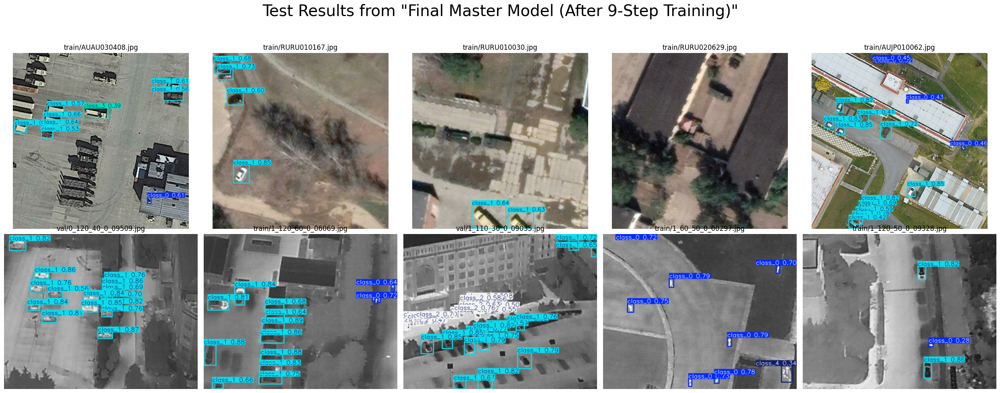

In [14]:
import random
from pathlib import Path
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2

# --- 1. Define the FINAL MASTER MODEL to test ---
# This path points to the result of the very last training step.
model_path = Path('/kaggle/working/yolo_custom_plan_run/9_hituav_thermal_refine/weights/best.pt')
model_name = "Final Master Model (After 9-Step Training)"
print(f"--- Testing Final Model: {model_name} ---")
print(f"Model Path: {model_path}")


# --- 2. Define the paths to ALL ORIGINAL source datasets ---
kaggle_input_path = Path('/kaggle/input/')
source_datasets = [
    {'name': 'visdrone', 'path': kaggle_input_path / 'visdrone-dataset/VisDrone_Dataset'},
    {'name': 'mvrsd_aerial', 'path': kaggle_input_path / 'mvrsd-aerial/MVRSD_dataset'},
    {'name': 'kiit_mita', 'path': kaggle_input_path / 'kiit-mita/KIIT-MiTA'},
    {'name': 'military_assets', 'path': kaggle_input_path / 'military-assets-dataset-12-classes-yolo8-format/military_object_dataset'},
    {'name': 'hituav', 'path': kaggle_input_path / 'hituav-a-highaltitude-infrared-thermal-dataset/hit-uav'}
]

# --- 3. Create a balanced test set by sampling 5 images from EACH dataset ---
images_for_final_test = []
print("\nCreating a balanced test set by sampling from each source dataset...")

for dataset in source_datasets:
    print(f"  Sampling from: {dataset['name']}...")
    image_pool = []
    # Create a comprehensive pool of images by searching common subfolders
    for split_name in ['train', 'val', 'test', 'images', 'data/images/train', 'data/images/val', 'images/train', 'images/val', 'labels/train', 'labels/val']:
        image_pool.extend(list((dataset['path'] / split_name).glob('*.*')))

    if not image_pool:
        print(f"    ⚠️ Warning: No images found for {dataset['name']}. Skipping.")
        continue
    
    # Remove duplicates and filter for common image types
    image_pool = list(set(p for p in image_pool if p.suffix.lower() in ['.jpg', '.jpeg', '.png']))
    
    sample_size = min(5, len(image_pool))
    if sample_size > 0:
        images_for_final_test.extend(random.sample(image_pool, sample_size))

print(f"\n✅ Created a balanced test set with {len(images_for_final_test)} images.")


# --- 4. Run inference and display the grid of results ---
if images_for_final_test:
    if not model_path.exists():
        print(f"🚨 FATAL ERROR: The model file was not found at {model_path}")
    else:
        model = YOLO(model_path)
        
        num_images = len(images_for_final_test)
        num_cols = 5
        num_rows = (num_images + num_cols - 1) // num_cols
        
        fig, axs = plt.subplots(num_rows, num_cols, figsize=(25, 5 * num_rows))
        fig.suptitle(f'Test Results from "{model_name}"', fontsize=28, y=1.0)
        
        axs = axs.flatten()

        for i, image_path in enumerate(images_for_final_test):
            results = model.predict(source=str(image_path), save=False, verbose=False)
            annotated_image = results[0].plot()
            
            ax = axs[i]
            ax.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
            ax.set_title(f"{image_path.parent.name}/{image_path.name}")
            ax.axis('off')
            
        for i in range(num_images, len(axs)):
            axs[i].axis('off')

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

--- Testing Final Model: Final Master Model (After 9-Step Training) ---
Model Path: /kaggle/working/yolo_custom_plan_run/5_military_assets/weights/best.pt

Creating a balanced test set by recursively searching each source dataset...
  Searching in: visdrone...
    Found 10209 images, sampled 5.
  Searching in: mvrsd_aerial...
    Found 3000 images, sampled 5.
  Searching in: kiit_mita...
    Found 1700 images, sampled 5.
  Searching in: military_assets...
    Found 26315 images, sampled 5.
  Searching in: hituav...
    Found 2866 images, sampled 5.

✅ Created a balanced test set with 25 images.


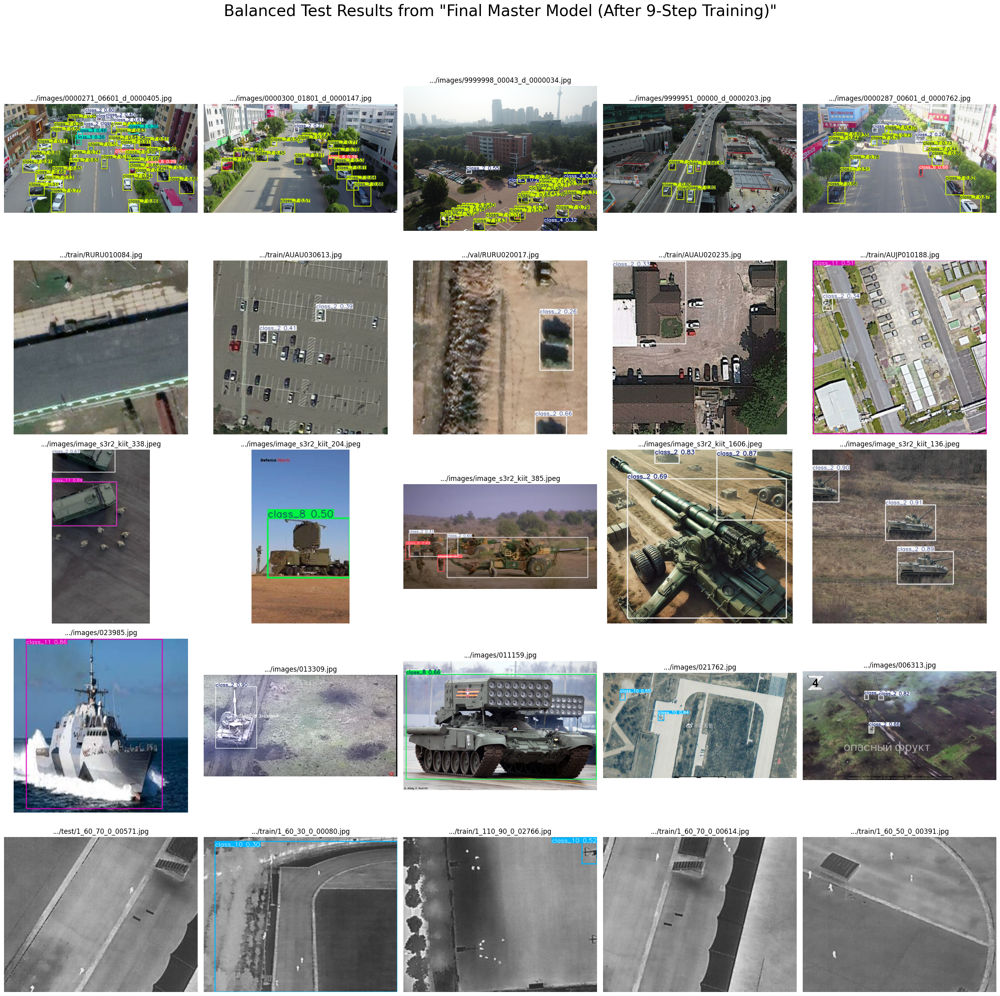

In [16]:
import random
from pathlib import Path
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2

# --- 1. Define the FINAL MASTER MODEL to test ---
model_path = Path('/kaggle/working/yolo_custom_plan_run/5_military_assets/weights/best.pt')
model_name = "Final Master Model (After 9-Step Training)"
print(f"--- Testing Final Model: {model_name} ---")
print(f"Model Path: {model_path}")


# --- 2. Define the paths to ALL ORIGINAL source datasets ---
kaggle_input_path = Path('/kaggle/input/')
source_datasets = [
    {'name': 'visdrone', 'path': kaggle_input_path / 'visdrone-dataset/VisDrone_Dataset'},
    {'name': 'mvrsd_aerial', 'path': kaggle_input_path / 'mvrsd-aerial/MVRSD_dataset'},
    {'name': 'kiit_mita', 'path': kaggle_input_path / 'kiit-mita/KIIT-MiTA'},
    {'name': 'military_assets', 'path': kaggle_input_path / 'military-assets-dataset-12-classes-yolo8-format/military_object_dataset'},
    {'name': 'hituav', 'path': kaggle_input_path / 'hituav-a-highaltitude-infrared-thermal-dataset/hit-uav'}
]

# --- 3. Create a balanced test set with a ROBUST recursive search ---
images_for_final_test = []
print("\nCreating a balanced test set by recursively searching each source dataset...")

for dataset in source_datasets:
    print(f"  Searching in: {dataset['name']}...")
    
    # --- KEY FIX: Use rglob for a deep, recursive search for all image types ---
    image_pool = list(dataset['path'].rglob('*.jpg')) + \
                 list(dataset['path'].rglob('*.jpeg')) + \
                 list(dataset['path'].rglob('*.png'))

    # Remove duplicates
    image_pool = list(set(image_pool))

    if not image_pool:
        print(f"    ⚠️ Warning: No images found for {dataset['name']} even with a recursive search. Please check the directory path.")
        continue
    
    sample_size = min(5, len(image_pool))
    images_for_final_test.extend(random.sample(image_pool, sample_size))
    print(f"    Found {len(image_pool)} images, sampled {sample_size}.")

print(f"\n✅ Created a balanced test set with {len(images_for_final_test)} images.")


# --- 4. Run inference and display the grid of results ---
if images_for_final_test:
    if not model_path.exists():
        print(f"🚨 FATAL ERROR: The model file was not found at {model_path}")
    else:
        model = YOLO(model_path)
        
        num_images = len(images_for_final_test)
        num_cols = 5
        num_rows = (num_images + num_cols - 1) // num_cols
        
        fig, axs = plt.subplots(num_rows, num_cols, figsize=(25, 5 * num_rows))
        fig.suptitle(f'Balanced Test Results from "{model_name}"', fontsize=28, y=1.0)
        
        axs = axs.flatten()

        for i, image_path in enumerate(images_for_final_test):
            results = model.predict(source=str(image_path), save=False, verbose=False)
            annotated_image = results[0].plot()
            
            ax = axs[i]
            ax.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
            # Create a more readable title
            title_path = f".../{image_path.parent.name}/{image_path.name}"
            ax.set_title(title_path)
            ax.axis('off')
            
        for i in range(num_images, len(axs)):
            axs[i].axis('off')

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

In [17]:
import shutil
from pathlib import Path

# Define the path to the folder you want to zip
folder_to_zip = Path('/kaggle/working/yolo_custom_plan_run')

# Define the path for the output zip file
output_zip_file = Path('/kaggle/working/all_training_runs.zip')

print(f"Compressing folder: {folder_to_zip}")

try:
    # Create the zip archive
    shutil.make_archive(
        base_name=str(output_zip_file).replace('.zip', ''), # Path without the .zip extension
        format='zip',                                     # The format to use (zip, tar, etc.)
        root_dir=folder_to_zip                            # The folder to compress
    )
    print(f"\n✅ Successfully created zip file at: {output_zip_file}")
    print("You can now proceed to Step 2 to download this file.")

except FileNotFoundError:
    print(f"🚨 ERROR: The directory '{folder_to_zip}' was not found. Make sure the training has run.")
except Exception as e:
    print(f"An error occurred during compression: {e}")

Compressing folder: /kaggle/working/yolo_custom_plan_run

✅ Successfully created zip file at: /kaggle/working/all_training_runs.zip
You can now proceed to Step 2 to download this file.
